# Realistic, Simulated Bayesian Marketing Mix

See `readme.md` for a brief high-level intro. Here, I'll focus on the results.

## Methods

Here, I attempt to simulate a real-world marketing mix dataset with many of the imperfection you'll see in the wild (see `readme` for some details) and then fit a number of models of increasing sophistication.

In approximate order, I fit:
- frequentist regressions, with fixed effects or fully unpooled coefficients (one coefficient per geo hierarchy, with no shared information)  
- canned bayesian mixed effects regression, with `bambi` and some slightly obvious mis-specification (e.g. additive instead of multiplicative seasonality)  
- a custom bayesian model (in `pymc3`) incorporating more of our domain knowledge. still, in the spirit of realism, it does not simply represent the true data generating process. after all, as mr. Box once said, `all models are wrong[...]`  
- an ADVI approximation of the custom bayesian model  


## Results

I compare the results briefly in terms of estimated LOO CV performance (non-timeseries) and in terms of paramter recovery. None are perfect, but our more sophisticated approach does outperform the canned approaches in both LOO CV and parameter recovery/bias senses.  


In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns

# note I'm running the bleeding edge PyMC dev version, which will continue to evolve.
import pymc3 as pm
import bambi as bmb
import arviz as az
from IPython.core.interactiveshell import InteractiveShell


InteractiveShell.ast_node_interactivity = "all"
pd.set_option("display.max_columns", 200)

az.style.use("arviz-darkgrid")

rc = {
    "plot.max_subplots": 80,
}
az.rcParams.update(rc)

In [2]:
!conda list

# may also try pm bleeding edge
# import pymc as pm4

%load_ext lab_black

# packages in environment at /home/jan/miniconda3/envs/2021-11:
#
# Name                    Version                   Build  Channel
_libgcc_mutex             0.1                 conda_forge    conda-forge
_openmp_mutex             4.5                      1_llvm    conda-forge
aeppl                     0.0.14                   pypi_0    pypi
alsa-lib                  1.2.3                h516909a_0    conda-forge
anyio                     3.4.0            py39hf3d152e_0    conda-forge
argon2-cffi               21.1.0           py39h3811e60_2    conda-forge
arviz                     0.11.4             pyhd8ed1ab_0    conda-forge
async_generator           1.10                       py_0    conda-forge
atk-1.0                   2.36.0               h3371d22_4    conda-forge
attrs                     21.2.0             pyhd8ed1ab_0    conda-forge
babel                     2.9.1              pyh44b312d_0    conda-forge
backcall                  0.2.0              pyh9f0ad1d_0    conda-forg

## Data Simulation

_TODO_: there are no true confounds below (affect outcome and treatment). would be cool to add e.g. "macro," which would affect both demand/CPA _and_ spend.  

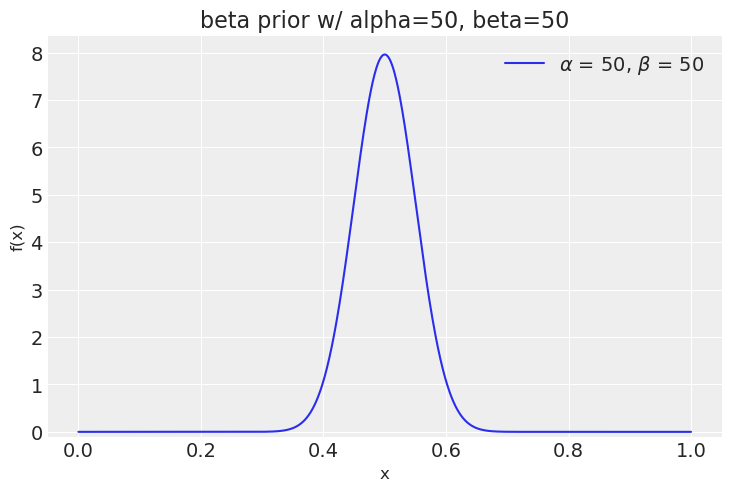

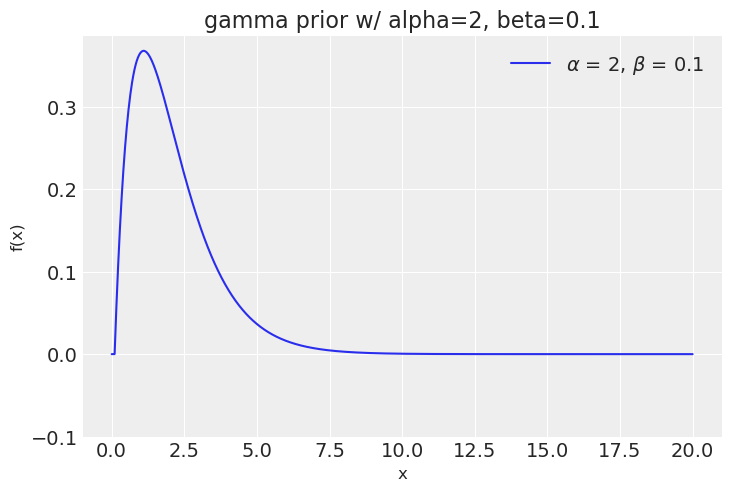

In [3]:
import scipy as sp


def vis_beta(a: float, b: float) -> None:
    xs = np.linspace(0, 1, 1_000)
    pdf = sp.stats.beta.pdf(xs, a, b)
    plt.plot(xs, pdf, label=r"$\alpha$ = {}, $\beta$ = {}".format(a, b))
    plt.ylim(
        -0.1,
    )
    plt.xlabel("x", fontsize=12)
    plt.ylabel("f(x)", fontsize=12)
    plt.legend(loc=1)
    plt.title(f"beta prior w/ alpha={a}, beta={b}")
    plt.show()


vis_beta(50, 50)


def vis_gamma(a: float, b: float) -> None:
    xs = np.linspace(0, 20, 1_000)
    pdf = sp.stats.gamma.pdf(xs, a, b)
    plt.plot(xs, pdf, label=r"$\alpha$ = {}, $\beta$ = {}".format(a, b))
    plt.ylim(
        -0.1,
    )
    plt.xlabel("x", fontsize=12)
    plt.ylabel("f(x)", fontsize=12)
    plt.legend(loc=1)
    plt.title(f"gamma prior w/ alpha={a}, beta={b}")
    plt.show()


vis_gamma(2, 0.1)

In [281]:
START_DATE = "2016-01-01"
SEED = 2001
N_GEOS = 50  # e.g. 50 states in US
WKS_IN_YR = 52
MAX_WEEKS = 5 * WKS_IN_YR  # 5 years
BASELINE_SPEND = (
    25  # USD, we'll then twist this with various correlated + uncorrelated noise
)
# one challenge w/ MMM is that realistically, spend doesn't fluctuate dramatically;
# here rel. to mean of 1-ish, it's about 1/10 of spend, which seems not-crazy.
POOLED_SPEND_STD_SCALING = 0.10
MEAN_CPA = 5.0  # USD 'cost per action' = buy our product
SEASONALITY_SCALE = 0.1  # percent
# Realistically, don't assume channels are equal size.
CHANNEL_SCALE = {
    "google_nonbrand": 4,
    "google_brand": 1.5,
    "facebook": 3,
    "instagram": 1,
    "direct_mail": 1,
    "youtube": 1,
    "sponsored_content": 0.5,
    "bing": 0.5,
    "pinterest": 0.25,
    "out_of_home": 0.5,
}
# Limitation: would like efficiency to drift.
CHANNEL_EFFICIENCY = {  # as multiple of average
    "google_nonbrand": 1.0,
    "google_brand": 1.5,  # ignore causal issues w/ branded ads for now
    "facebook": 1.1,
    "instagram": 1.2,
    "direct_mail": 1.25,
    "youtube": 1.2,
    "sponsored_content": 1.25,
    "bing": 1.4,
    "pinterest": 1.2,
    "out_of_home": 0.5,
}
assert CHANNEL_SCALE.keys() == CHANNEL_EFFICIENCY.keys()

# Numpy recommends `generator` interface going forward.
rng = np.random.default_rng(SEED)


def additive_random_walk(
    n: int, mu: float = 0.1, sigma: float = 0.01, start: float = 100
):
    """
    Additive or multiplicative seems defensible for demand.
    """
    walk = rng.normal(mu, sigma, size=n)
    return start + np.cumsum(walk)


# Simulate market tenure as uniformly distributed from start-->3/4 through timeseries.
market_start_idxs = {
    i: first_week
    for i, first_week in enumerate(rng.integers(0, (3 * MAX_WEEKS) // 4, size=N_GEOS))
}

# Simulate basic market-level characteristics.
chunks = []
for market, start_i in market_start_idxs.items():
    this_market = pd.DataFrame(
        [i for i in range(start_i, MAX_WEEKS)], columns=["week_i"]
    )
    this_market["market_idx"] = market
    this_market["market"] = "geo_" + str(market)
    # Simulate populations as drawn from a lognormal distribution.
    # (pareto would also be defensible; see e.g. https://sites.tufts.edu/yioannides/files/2012/09/ioannides-skouras-june-21-2012.pdf )
    # note: parameterized by LOGGED dist, not raw.
    this_market["population"] = rng.lognormal(15.5, 1.0)

    # Note: marking private fields used in simulation with leading underscore.
    #       These should never be used in our models.

    # Don't assume equal efficiency everywhere!
    # Centered @ 1.0
    this_market["_market_efficiency"] = 2 * rng.beta(20, 20)

    # Add baseline/organic demand.
    # Negative binomial will show the overdispersion typical of real-world purchase data.
    # I believe at p=0.5, equivalent to poisson.
    pop_this_geo = this_market.population[0]
    this_market["_baseline_demand"] = rng.negative_binomial(
        pop_this_geo / 100_000, 0.7, size=this_market.shape[0]
    )

    chunks.append(this_market)

spends = pd.concat(chunks)
spends.market = spends.market.astype("category")
mean_market_size = this_market.population.mean()
# Assume spend scaled to population.
# We'll then introduce random walks/trends and noise based on this.
spends["_avg_spend"] = BASELINE_SPEND * (spends["population"] / mean_market_size)

# Add confounds:
# - pricing (demand), assume linear price elasticity, observable
# - interest in pour-over coffee (demand), will also model as simple linear effect. note this is unobservable.
# - seasonality
# - (more to come, eventually)
PRICE_ELASTICITY = 0.25  # loosely defined; I'm not an economist ;)
spends["price"] = 40
spends.loc[spends.week_i > 0.75 * WKS_IN_YR, "price"] = 35
spends.loc[spends.week_i > 1.5 * WKS_IN_YR, "price"] = 30
spends.loc[spends.week_i > 3 * WKS_IN_YR, "price"] = 25
spends["_price_demand"] = 1 + (spends.price / 40) * PRICE_ELASTICITY

coffee_interest_ts = pd.Series(
    additive_random_walk(MAX_WEEKS, mu=5e-3, sigma=3e-2, start=1),
    index=range(MAX_WEEKS),
    name="_coffee_interest",
)
len_before = len(spends)
spends = spends.merge(
    coffee_interest_ts, how="inner", left_on="week_i", right_index=True, validate="m:1"
)
assert len(spends) == len_before
COFFEE_INTEREST_DEMAND_SCALE = 0.25
spends["_coffee_interest_demand"] = (
    1 + spends._coffee_interest * COFFEE_INTEREST_DEMAND_SCALE
)

# Cosine seasonality (sell better @ holidays)
week_idxs = np.arange(0, WKS_IN_YR, 1)
seasonality = pd.DataFrame(
    index=week_idxs,
    data=1 + SEASONALITY_SCALE * np.cos(week_idxs * 2 * np.pi / WKS_IN_YR),
    columns=["_seasonality"],
)
seasonality.index = seasonality.index.rename("wk_in_yr")
spends["wk_in_yr"] = spends.week_i % 52
spends = spends.merge(
    seasonality, how="inner", left_on="wk_in_yr", right_index=True, validate="m:1"
)
assert len(spends) == len_before
assert spends.wk_in_yr.between(0, WKS_IN_YR).all()

# Treat all spends as following:
# + marketing stakeholders' general desire to spend (random walk for ALL channel)
# + marketing stakeholders' preferences b/w channels (channel-level walk)
# + noise
spends_trend = pd.Series(
    np.abs(additive_random_walk(MAX_WEEKS, mu=1e-2, sigma=1e-1, start=1)),
    index=range(MAX_WEEKS),
    name="_spend_trend",
)
spends = spends.merge(
    spends_trend, how="inner", left_on="week_i", right_index=True, validate="m:1"
)
assert len(spends) == len_before

# Simulate (market, channel) spends and outcomes.
# Remember a row = 1 week in 1 market; cols for different spends in a given week.
spends["n_purchased"] = 0
for channel, scale in CHANNEL_SCALE.items():
    # Channel level IID noise + walk.
    spend_amt_noise = 2 * rng.beta(50, 50, size=spends.shape[0])
    channel_preference = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=0, sigma=2.5e-2, start=1)),
        index=range(MAX_WEEKS),
        name=f"_{channel}_spend_preference",
    )
    spends = spends.merge(
        channel_preference,
        how="inner",
        left_on="week_i",
        right_index=True,
        validate="m:1",
    )
    spends[channel] = (
        spend_amt_noise
        * scale
        * spends._avg_spend
        * spends._spend_trend
        * spends[f"_{channel}_spend_preference"]
    )

    spend_efficiency_noise = 2 * rng.beta(50, 50, size=spends.shape[0])

    # Finally, outcome based on marketing + confounding.
    # 1) determine efficiency (RoAS) to recover.
    # (TODO: should revisit what "true efficiency" we really want to recover - should it include e.g. price elasticity?
    spends[f"_{channel}_true_efficiency"] = (
        (CHANNEL_EFFICIENCY[channel]) * (1 / MEAN_CPA) * spends._market_efficiency
    )
    # Add confounding + noise.
    spends["n_purchased"] = (
        spends["n_purchased"]
        + spends[channel]
        * spends[f"_{channel}_true_efficiency"]
        * spends._coffee_interest_demand
        * spends._price_demand
        * spends._seasonality
        * spend_efficiency_noise
    ).round()  # can't sell fractional brewers ;)

# Also add baseline / ad-free organic demand.
baseline_demand_noise = np.abs(rng.normal(1, 0.5, size=len(spends)))
spends["n_purchased"] = (
    spends["n_purchased"] + spends._baseline_demand * baseline_demand_noise
)
spends["total_spend"] = spends[list(CHANNEL_SCALE.keys())].sum(axis="columns")
spends = spends.round(3)

# Add simple month_of column for quick&dirty fixed effect or multiplicative seasonality by month.
# Note I assumed earlier that 1 year == 52 weeks, which isn't quite true, but close enough. (dt is hard.)
spends["week_of"] = pd.to_datetime(START_DATE) + pd.to_timedelta("1w") * spends.week_i
spends["month_name"] = spends.week_of.dt.month_name()
# spends.week_of.max()
# spends["month_name"].value_counts()

# Add ts features for linear models
spends["month_name_i"] = (spends.week_of.dt.month - 1).astype("int8")
# spends.month_name_i.value_counts()

spends["qtr_i"] = np.round(
    (spends.week_of - spends.week_of.min()) / pd.to_timedelta("90d")
).astype(
    "int8"
)  # pd.to_datetime(spends.week_of).dt.to_period("Q")
# spends["qtr_i"].value_counts()

spends

,week_i,market_idx,market,population,_market_efficiency,_baseline_demand,_avg_spend,price,_price_demand,_coffee_interest,_coffee_interest_demand,wk_in_yr,_seasonality,_spend_trend,n_purchased,_google_nonbrand_spend_preference,google_nonbrand,_google_nonbrand_true_efficiency,_google_brand_spend_preference,google_brand,_google_brand_true_efficiency,_facebook_spend_preference,facebook,_facebook_true_efficiency,_instagram_spend_preference,instagram,_instagram_true_efficiency,_direct_mail_spend_preference,direct_mail,_direct_mail_true_efficiency,_youtube_spend_preference,youtube,_youtube_true_efficiency,_sponsored_content_spend_preference,sponsored_content,_sponsored_content_true_efficiency,_bing_spend_preference,bing,_bing_true_efficiency,_pinterest_spend_preference,pinterest,_pinterest_true_efficiency,_out_of_home_spend_preference,out_of_home,_out_of_home_true_efficiency,total_spend,week_of,month_name,month_name_i,qtr_i
0,3,0,geo_0,3.677349e+07,1.099,197,128.521,40,1.250,0.924,1.231,3,1.094,0.895,686.908,1.062,523.301,0.220,1.011,193.056,0.330,0.909,304.174,0.242,1.017,130.873,0.264,1.024,110.666,0.275,0.999,109.263,0.264,0.930,54.433,0.275,1.085,68.858,0.308,1.003,28.403,0.264,0.920,43.751,0.110,1566.778,2016-01-22,January,0,0
52,55,0,geo_0,3.677349e+07,1.099,157,128.521,35,1.219,1.211,1.303,3,1.094,1.340,1045.757,1.157,712.467,0.220,0.972,247.846,0.330,0.936,401.398,0.242,1.163,165.659,0.264,1.098,190.390,0.275,1.410,271.316,0.264,0.921,74.110,0.275,1.177,91.160,0.308,0.959,41.157,0.264,0.745,63.559,0.110,2259.062,2017-01-20,January,0,4
12,55,2,geo_2,4.475771e+07,0.733,192,156.425,35,1.219,1.211,1.303,3,1.094,1.340,951.984,1.157,1020.516,0.147,0.972,329.830,0.220,0.936,632.605,0.161,1.163,217.367,0.176,1.098,237.857,0.183,1.410,322.197,0.176,0.921,101.018,0.183,1.177,142.764,0.205,0.959,45.882,0.176,0.745,86.703,0.073,3136.738,2017-01-20,January,0,4
16,55,3,geo_3,9.964031e+05,1.156,4,3.482,35,1.219,1.211,1.303,3,1.094,1.340,30.911,1.157,20.597,0.231,0.972,6.513,0.347,0.936,12.373,0.254,1.163,4.816,0.277,1.098,6.022,0.289,1.410,6.791,0.277,0.921,2.501,0.289,1.177,3.047,0.324,0.959,1.113,0.277,0.745,1.432,0.116,65.204,2017-01-20,January,0,4
51,55,6,geo_6,1.380624e+06,0.912,8,4.825,35,1.219,1.211,1.303,3,1.094,1.340,37.553,1.157,30.660,0.182,0.972,8.794,0.274,0.936,14.727,0.201,1.163,8.187,0.219,1.098,6.537,0.228,1.410,11.509,0.219,0.921,2.711,0.228,1.177,4.137,0.255,0.959,1.717,0.219,0.745,2.231,0.091,91.211,2017-01-20,January,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,210,45,geo_45,3.959841e+06,0.841,25,13.839,25,1.156,2.427,1.607,2,1.097,1.735,155.217,1.527,147.104,0.168,0.598,19.651,0.252,1.141,77.989,0.185,1.155,24.945,0.202,1.269,35.051,0.210,1.175,28.146,0.202,1.265,12.494,0.210,1.160,13.936,0.236,0.933,4.691,0.202,0.528,6.705,0.084,370.711,2020-01-10,January,0,16
115,210,46,geo_46,1.439907e+07,0.955,54,50.324,25,1.156,2.427,1.607,2,1.097,1.735,670.503,1.527,521.283,0.191,0.598,81.716,0.287,1.141,317.859,0.210,1.155,97.809,0.229,1.269,112.825,0.239,1.175,90.391,0.229,1.265,43.550,0.239,1.160,40.367,0.267,0.933,20.807,0.229,0.528,24.702,0.096,1351.310,2020-01-10,January,0,16
161,210,47,geo_47,8.959465e+06,1.000,41,31.313,25,1.156,2.427,1.607,2,1.097,1.735,502.477,1.527,340.494,0.200,0.598,53.958,0.300,1.141,193.480,0.220,1.155,72.826,0.240,1.269,81.395,0.250,1.175,59.471,0.240,1.265,29.341,0.250,1.160,35.938,0.280,0.933,13.617,0.240,0.528,14.088,0.100,894.609,2020-01-10,January,0,16
102,210,48,geo_48,3.589552e+06,0.950,15,12.545,25,1.156,2.427,1.607,2,1.097,1.735,150.167,1.527,132.575,0.190,0.598,19.711,0.285,1.141,61.168,0.209,1.155,27.103,0.228,1.269,29.022,0.238,1.175,21.378,0.228,1.265,12.979,0.238,1.160,12.024,0.266,0.933,4.538,0.228,0.528,5.319,0.095,325.817,2020-01-10,January,0,16


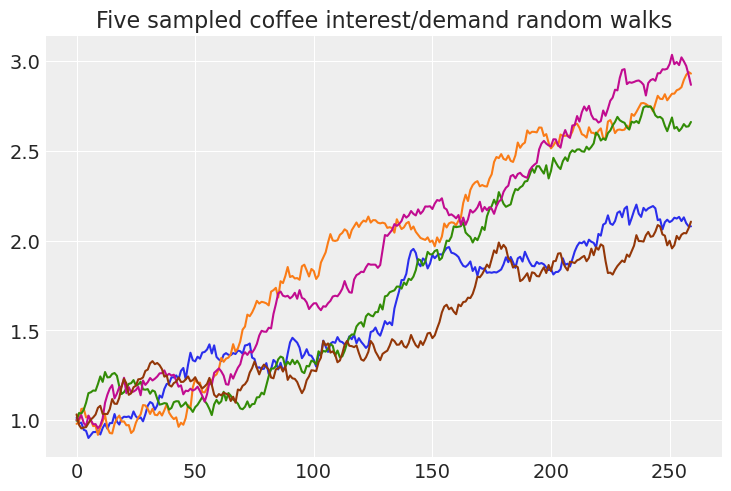

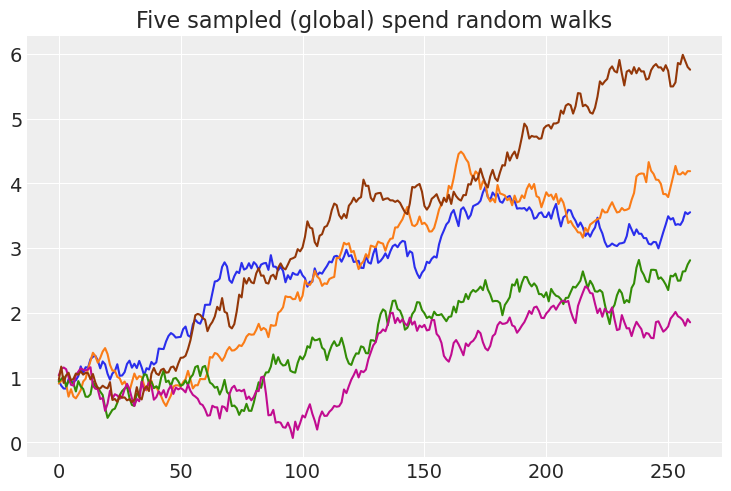

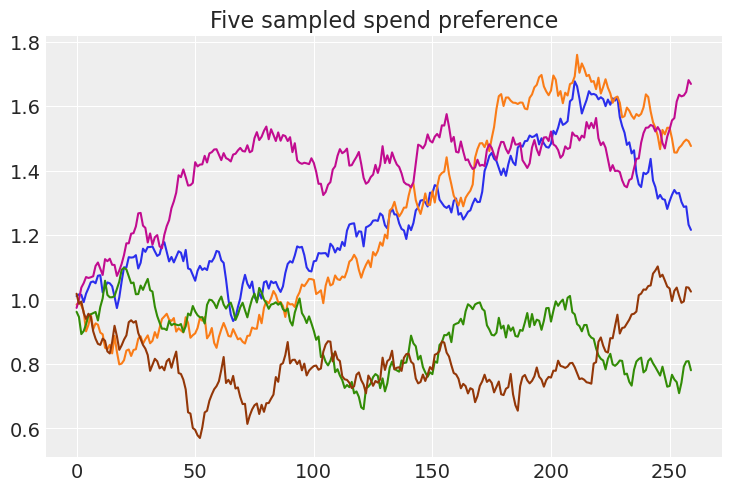

In [208]:
# develop intuition for random walk params.
for i in range(5):
    walk = pd.Series(
        additive_random_walk(MAX_WEEKS, mu=5e-3, sigma=3e-2, start=1),
        index=range(MAX_WEEKS),
        name="_coffee_interest",
    )
    plt.plot(walk)
_ = plt.title("Five sampled coffee interest/demand random walks")
_ = plt.show()

for i in range(5):
    walk = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=1e-2, sigma=1e-1, start=1)),
        index=range(MAX_WEEKS),
        name="_spend_trend",
    )
    plt.plot(walk)
_ = plt.title("Five sampled (global) spend random walks")
_ = plt.show()

for i in range(5):
    walk = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=0, sigma=2.5e-2, start=1)),
        index=range(MAX_WEEKS),
        name=f"_{channel}_spend_preference",
    )
    plt.plot(walk)
_ = plt.title("Five sampled spend preference")
_ = plt.show()

noting a few limitations:  
- something with breakpoints would probably be slightly more realistic - typically stakeholders will make decisions with logic like "I think x channel hasn't been doing well" or "we're spending too much, need to pull back." not a strict random walk.    
- lack of adstock (ad efficacy isn't perfectly instantaneous and doesn't decay instantaneously)  
- lack of saturation (reduced efficiency at high spends)  

In [209]:
# QA
# We could use great_expectations, but I'll be slightly lazy and use use bare asserts.

spend_cols = list(CHANNEL_SCALE.keys())

POS_COLS = [
    "population",
    "_market_efficiency",
    "_baseline_demand",
    "_avg_spend",
    "price",
    "_price_demand",
    "_coffee_interest",
    "_coffee_interest_demand",
    "_spend_trend",
    "n_purchased",
    "total_spend",
] + spend_cols

notna_cols = POS_COLS

assert all([(spends[c] >= 0).all() for c in POS_COLS])
assert all([spends[c].notna().all() for c in notna_cols])

Text(0.5, 0, 'Week Index')

Text(0, 0.5, 'Weekly Spend (Across All Geos)')

Text(0.5, 1.0, 'Spend Trend (Across All Geos)')

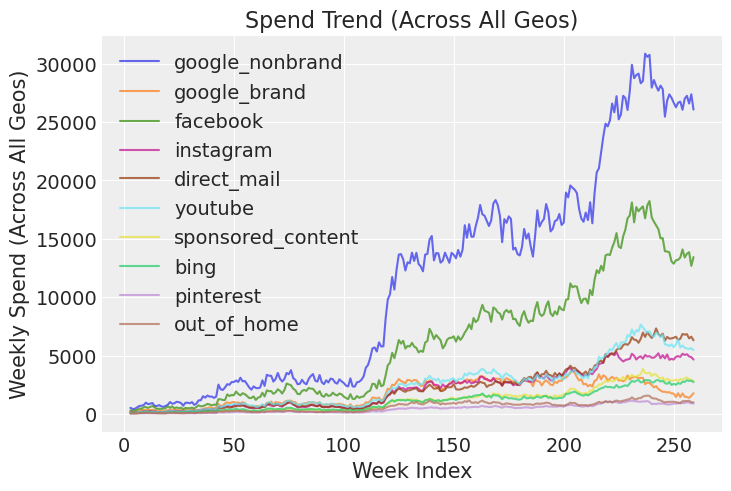

In [293]:
# QA spend trends

OUTCOME = "n_purchased"
# note: I use confound loosely to mean "things that affect the outcome that aren't affected by the treatment".
#       A more correct definition might restrict it to needing to affect the treatment value.
GOOD_CONTROLS = [
    "market",
    # this control is not strictly necessary but will likely improve our finite sample estimate.
    # ALSO true effect is multiplicative, not additive.
    "price",
    "month_name",  # quick+dirty seasonality.
    "qtr_i",
]
BAD_CONTROLS = [
    "population"
]  # controling will dilute our marketing spend effect, since its effect is fully through marketing spend!

for channel in spend_cols:
    weekly_spend = spends.groupby("week_i")[channel].sum()
    _ = plt.plot(weekly_spend, alpha=0.7)

plt.xlabel("Week Index")
plt.ylabel("Weekly Spend (Across All Geos)")
plt.title("Spend Trend (Across All Geos)")
plt.legend(CHANNEL_SCALE.keys())

Text(0.5, 0, 'Week Index')

Text(0, 0.5, 'Weekly Spend (Sample Single Geo)')

Text(0.5, 1.0, 'Spend Trend (Sample Single Geo)')

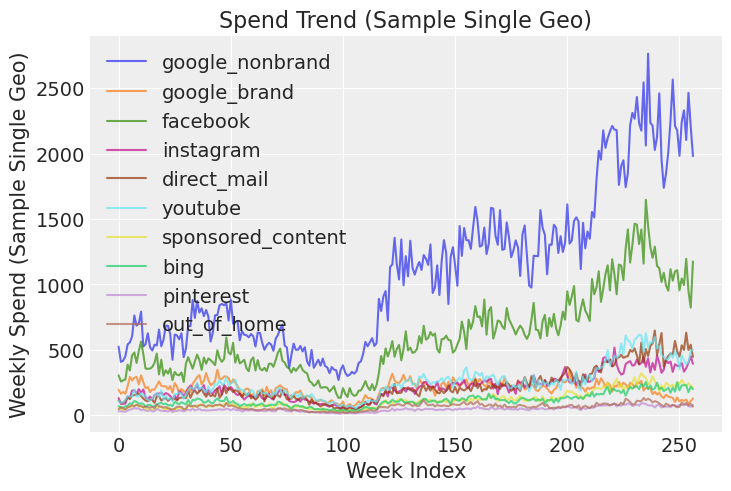

In [283]:
# Natl. level hides some trends - view within a given market.

oldest_market = spends.market.value_counts().index[0]

for channel in CHANNEL_SCALE.keys():
    weekly_spend = spends.loc[spends.market == oldest_market].sort_values(
        "week_i", ascending=True
    )[channel]
    _ = plt.plot(weekly_spend, alpha=0.7)

plt.xlabel("Week Index")
plt.ylabel("Weekly Spend (Sample Single Geo)")
plt.title("Spend Trend (Sample Single Geo)")
plt.legend(CHANNEL_SCALE.keys())

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Reminder: purchased qty very right-skewed')

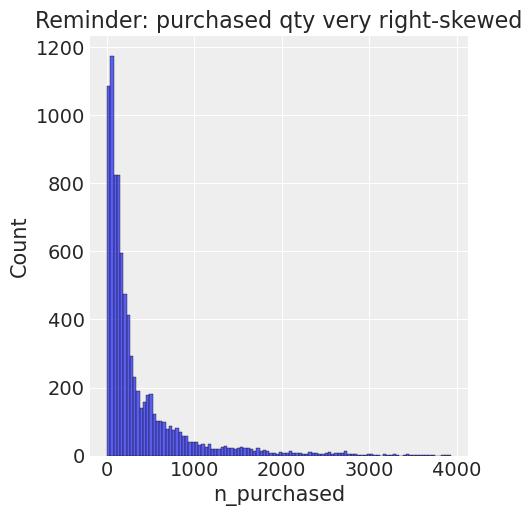

In [284]:
sns.displot(spends.n_purchased)
plt.title("Reminder: purchased qty very right-skewed")

#### Parameters to recover

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of google_nonbrand')

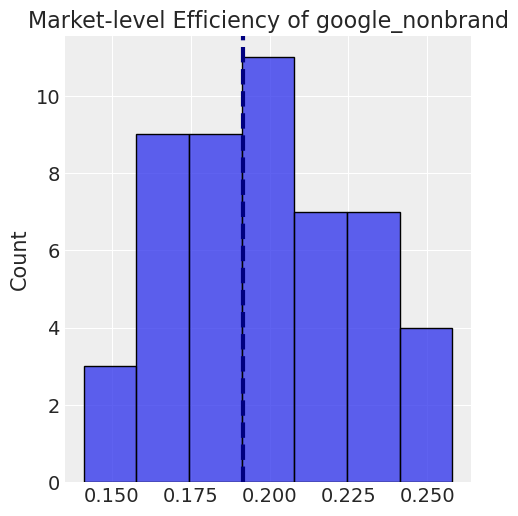

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of google_brand')

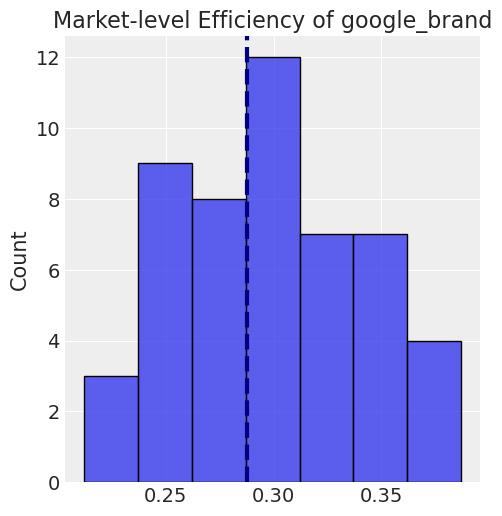

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of facebook')

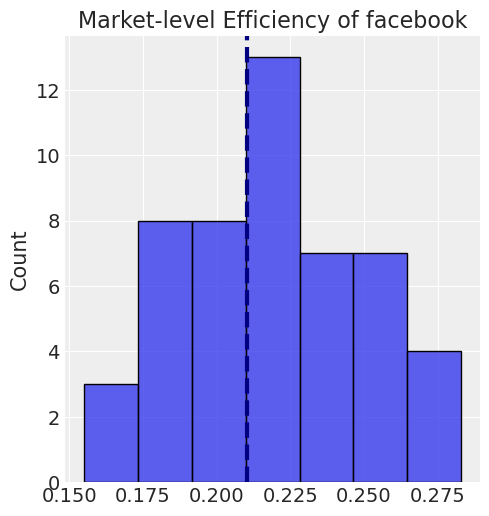

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of instagram')

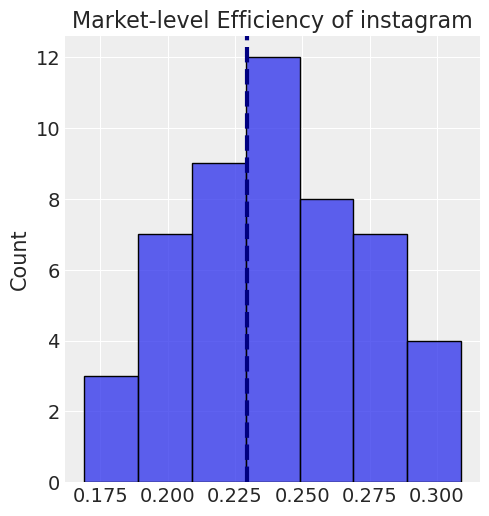

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of direct_mail')

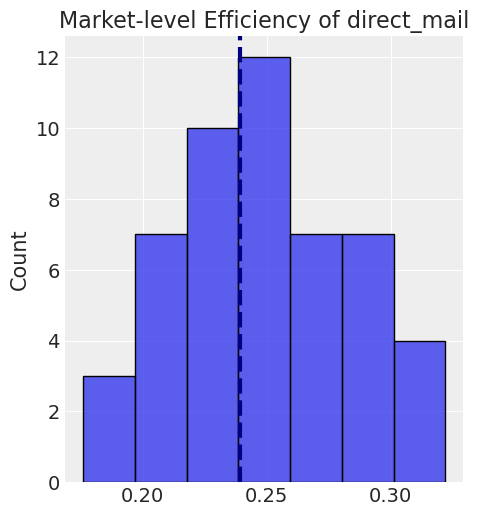

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of youtube')

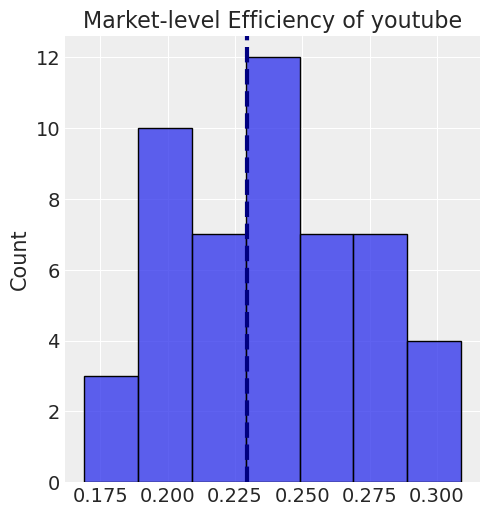

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of sponsored_content')

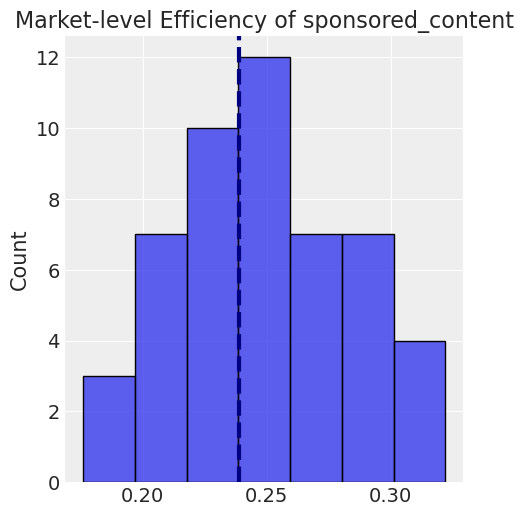

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of bing')

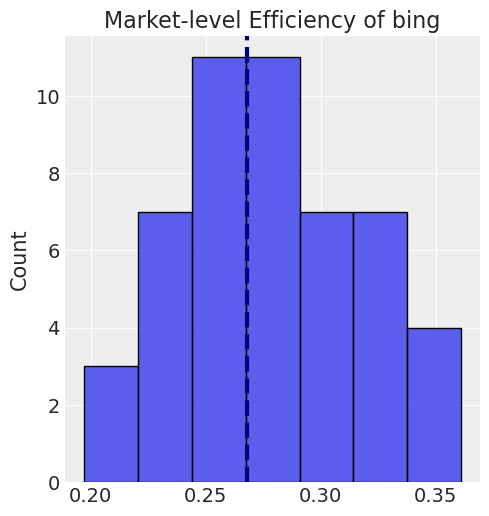

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of pinterest')

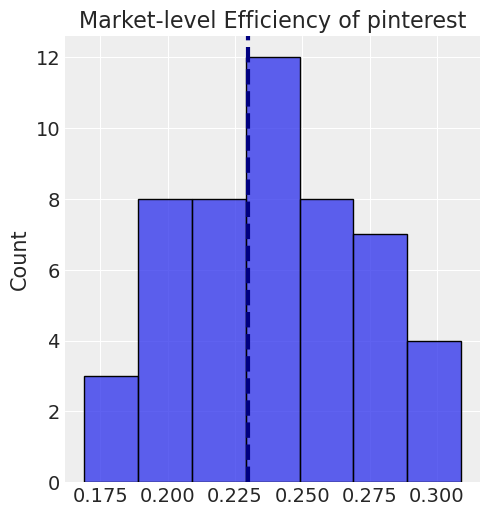

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of out_of_home')

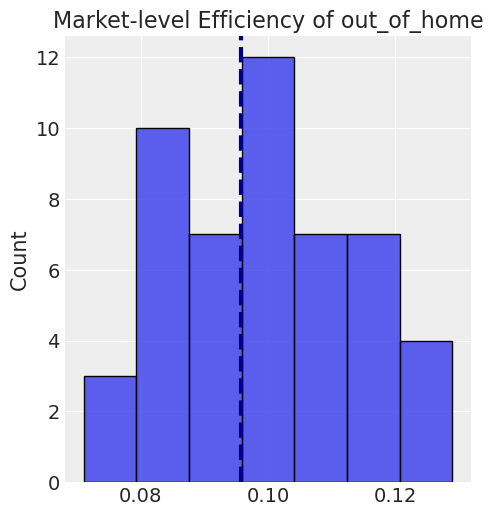

,overall_efficiency
google_brand,0.288
bing,0.268
direct_mail,0.239
sponsored_content,0.239
instagram,0.230
youtube,0.230
pinterest,0.230
facebook,0.210
google_nonbrand,0.191
out_of_home,0.096


In [213]:
true_efficiencies = pd.DataFrame(index=spend_cols)

# perhaps could be a wonky pivot, we'll just use a for.
# we'll aim to recover the weighted average efficiency (RoAS) over the full timeseries.
for spend_col in spend_cols:
    mkt_efficiency = (
        spends.groupby("market")
        .apply(
            lambda ser: (
                ser[f"_{spend_col}_true_efficiency"]
                * ser[spend_col]
                / ser[spend_col].sum()
            ).sum()
        )
        .sort_index()
    )
    sns.displot(mkt_efficiency)
    plt.title(f"Market-level Efficiency of {spend_col}")

    overall_efficiency = (
        spends[f"_{spend_col}_true_efficiency"]
        * spends[spend_col]
        / spends[spend_col].sum()
    ).sum()
    true_efficiencies.loc[spend_col, "overall_efficiency"] = overall_efficiency
    plt.axvline(overall_efficiency, color="navy", linestyle="--", linewidth=3)

    plt.show()

true_efficiencies = true_efficiencies.round(3).sort_values(
    "overall_efficiency", ascending=False
)
true_efficiencies

## Modeling

Broadly, here's my wishlist of models to fit:  
- Frequentist, fixed effects, no confounding
- Frequentist, random/unpooled (slope and intercept)
- Frequentist, bad controls (stick everything in)
- Frequentist, roughly correctly specified

- Bayesian mixed effects
- (Bayesian with random walk)
- (Bayesian with saturation and/or decay)
- Our preferred Bayesian model but fit with minibatch full rank ADVI
- Our preferred Bayesian model but fit with SVGD

We'll start with more basic ones, build up to more complex ones, and then try speeding things up a bit.  

### Frequentist Models

In [285]:
# Most basic model, ignoring confounding entirely.
import statsmodels.formula.api as smf
import statsmodels.api as sm

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols)}",
    data=spends,
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

model = smf.glm(
    f"{OUTCOME} ~ {' + '.join(spend_cols)}",
    data=spends,
    family=sm.families.NegativeBinomial(),
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     2826.
Date:                Sun, 12 Dec 2021   Prob (F-statistic):               0.00
Time:                        17:31:07   Log-Likelihood:                -52497.
No. Observations:                8567   AIC:                         1.050e+05
Df Residuals:                    8556   BIC:                         1.051e+05
Df Model:                          10                                         
Covariance Type:                  HC3                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            23.1461      1.348     17.166      0.000      20.503      25.789
google_nonbrand       0.3945      0.046      8.636      0.000       0.305       0.484
google_brand          0.1878      0.154      1.219      0.223      -0.114       0.490
facebook              0.1115      0.087      1.282      0.200      -0.059       0.282
instagram             1.6437      0.272      6.054      0.000       1.112       2.176
direct_mail           0.5749      0.210      2.732      0.006       0.162       0.987
youtube              -0.0024      0.194     -0.012      0.990      -0.382       0.378
sponsored_content    -0.3424      0.475     -0.721      0.471      -1.274       0.589
bing                  1.5056      0.499      3.019      0.003       0.528       2.483
pinterest             3.0179      1.219      2.476      0.013       0.629       5.407
out_of_home          -1.6306      0.640     -2.550      0.011      -2.884      -0.377
==============================================================================
Omnibus:                     3038.040   Durbin-Watson:                   1.828
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            83328.725
Skew:                           1.110   Prob(JB):                         0.00
Kurtosis:                      18.117   Cond. No.                         915.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:            n_purchased   No. Observations:                 8567
Model:                            GLM   Df Residuals:                     8556
Model Family:        NegativeBinomial   Df Model:                           10
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -55097.
Date:                Sun, 12 Dec 2021   Deviance:                       3805.8
Time:                        17:31:08   Pearson chi2:                 2.74e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6396
Covariance Type:                  HC3                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             4.6717      0.013    371.324      0.000       4.647       4.696
google_nonbrand       0.0006      0.000      3.978      0.000       0.000       0.001
google_brand          0.0036      0.001      6.832      0.000       0.003       0.005
facebook           5.903e-05      0.000      0.189      0.850      -0.001       0.001
instagram             0.0006      0.001      0.671      0.502      -0.001       0.002
direct_mail           0.0020      0.001      2.854      0.004       0.001       0.003
youtube              -0.0002      0.001     -0.254      0.799      -0.002       0.001
sponsored_content    -0.0008      0.002     -0.540      0.590      -0.004       0.002
bing                  0.0032      0.002      1.863      0.063      -0.000       0.007
pinterest             0.0111      0.004      2.469      0.014       0.002       0.020
out_of_home          -0.0013      0.002     -0.574      0.566      -0.006       0.003
=====================================================================================
"""

- given large purchase numbers, not strictly necessary to avoid identity/OLS linear regression  
- note that our spend coefficients are __way off__ and not ranked terribly well due ignored confounding!  
- despite this, R2 is very high; reminder to not assume that high R2 means the model should be taken seriously.  

In [286]:
# "ok, but you didn't include confounds"
# "let's include the kitchen sink"

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS + BAD_CONTROLS)}",
    data=spends,
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/statsmodels/base/model.py:1863: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 74, but rank is 72
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     765.6
Date:                Sun, 12 Dec 2021   Prob (F-statistic):               0.00
Time:                        17:31:13   Log-Likelihood:                -48177.
No. Observations:                8567   AIC:                         9.650e+04
Df Residuals:                    8494   BIC:                         9.701e+04
Df Model:                          72                                         
Covariance Type:                  HC3                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                -118.8355     16.730     -7.103      0.000    -151.626     -86.045
market[T.geo_1]            -0.8028      1.831     -0.439      0.661      -4.391       2.785
market[T.geo_10]           -8.1669      2.023     -4.036      0.000     -12.133      -4.201
market[T.geo_11]         -203.8784      9.774    -20.859      0.000    -223.036    -184.721
market[T.geo_12]            1.4927      1.846      0.809      0.419      -2.125       5.111
market[T.geo_13]          -18.1030      2.293     -7.894      0.000     -22.598     -13.608
market[T.geo_14]           10.3197      1.805      5.718      0.000       6.782      13.857
market[T.geo_15]          -17.8138      1.979     -9.000      0.000     -21.693     -13.935
market[T.geo_16]           20.5638      5.192      3.961      0.000      10.388      30.740
market[T.geo_17]          -23.2480      1.825    -12.742      0.000     -26.824     -19.672
market[T.geo_18]         -112.6945      5.984    -18.833      0.000    -124.422    -100.967
market[T.geo_19]          -73.5729      2.703    -27.218      0.000     -78.871     -68.275
market[T.geo_2]          -515.0790     16.992    -30.313      0.000    -548.382    -481.776
market[T.geo_20]           11.7967      1.461      8.075      0.000       8.933      14.660
market[T.geo_21]          -37.7115      2.354    -16.017      0.000     -42.326     -33.097
market[T.geo_22]           -8.9639      1.723     -5.202      0.000     -12.341      -5.587
market[T.geo_23]           -2.6153      1.715     -1.525      0.127      -5.976       0.745
market[T.geo_24]           51.9893      2.649     19.627      0.000      46.798      57.181
market[T.geo_25]           14.0941      1.812      7.780      0.000      10.543      17.645
market[T.geo_26]           -6.8247      2.162     -3.157      0.002     -11.062      -2.588
market[T.geo_27]           12.6005      1.696      7.431      0.000       9.277      15.924
market[T.geo_28]            2.8716      1.964      1.462      0.144      -0.978       6.721
market[T.geo_29]           15.5042      1.362     11.381      0.000      12.834      18.174
market[T.geo_3]            10.2319      1.759      5.818      0.000       6.785      13.679
market[T.geo_30]           18.8200      1.754     10.732      0.000      15.383      22.257
market[T.geo_31]           17.7867      1.439     12.364      0.000      14.967      20.606
market[T.geo_32]            5.7460      1.884      3.049      0.002       2.053       9.439
market[T.geo_33]           -4.3137      1.490     -2.896      0.004      -7.233      -1.394
market[T.geo_34]          -96.4958      4.492    -21.481      0.000    -105.300     -87.691
market[T.geo_35]          -22.9666      1.694    -13.560      0.000     -26.286     -19.647
market[T.geo_36]         -139.8204      5.380  

now our coefficients are at least positive - and sometimes include their true-ish values in their CIs - but still way off.  

In [216]:
# less flippantly, build something a little more principled

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS)}",
    data=spends,
)
fitted = model.fit_regularized(alpha=1e-2, refit=True)
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     7409.
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        21:23:20   Log-Likelihood:                -48236.
No. Observations:                8567   AIC:                         9.662e+04
Df Residuals:                    8496   BIC:                         9.712e+04
Df Model:                          71                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 416.8728     11.676     35.704      0.000     393.985     439.760
market[T.geo_1]          -358.5875      9.420    -38.066      0.000    -377.053    -340.122
market[T.geo_10]         -303.4714      8.107    -37.435      0.000    -319.362    -287.581
market[T.geo_11]         -293.9367      6.739    -43.620      0.000    -307.146    -280.727
market[T.geo_12]         -336.8822      9.758    -34.525      0.000    -356.010    -317.755
market[T.geo_13]         -354.0994     11.400    -31.062      0.000    -376.445    -331.753
market[T.geo_14]         -353.9699      9.089    -38.945      0.000    -371.787    -336.153
market[T.geo_15]         -352.7644     10.061    -35.062      0.000    -372.487    -333.042
market[T.geo_16]         -226.4284      8.154    -27.770      0.000    -242.412    -210.445
market[T.geo_17]         -371.1297      8.984    -41.312      0.000    -388.740    -353.520
market[T.geo_18]         -340.1123      8.792    -38.686      0.000    -357.346    -322.879
market[T.geo_19]         -361.4251      8.879    -40.708      0.000    -378.829    -344.021
market[T.geo_2]          -436.3322      6.419    -67.978      0.000    -448.914    -423.750
market[T.geo_20]         -325.2657      8.711    -37.341      0.000    -342.341    -308.191
market[T.geo_21]         -361.3124     11.160    -32.376      0.000    -383.189    -339.436
market[T.geo_22]         -339.0878      9.286    -36.516      0.000    -357.291    -320.885
market[T.geo_23]         -358.1548      9.448    -37.908      0.000    -376.675    -339.634
market[T.geo_24]         -267.2126      9.208    -29.019      0.000    -285.263    -249.162
market[T.geo_25]         -350.6075      9.075    -38.635      0.000    -368.396    -332.819
market[T.geo_26]         -305.0621      8.315    -36.688      0.000    -321.362    -288.763
market[T.geo_27]         -339.7129      9.531    -35.643      0.000    -358.396    -321.030
market[T.geo_28]         -363.3021      9.110    -39.878      0.000    -381.161    -345.444
market[T.geo_29]         -329.9728      8.877    -37.172      0.000    -347.373    -312.572
market[T.geo_3]          -354.9081      9.190    -38.621      0.000    -372.922    -336.894
market[T.geo_30]         -336.7947      9.699    -34.726      0.000    -355.806    -317.783
market[T.geo_31]         -334.6953      9.080    -36.861      0.000    -352.494    -316.896
market[T.geo_32]         -359.2205      9.328    -38.511      0.000    -377.505    -340.936
market[T.geo_33]         -351.3899      9.382    -37.452      0.000    -369.782    -332.998
market[T.geo_34]         -341.1869      8.238    -41.416      0.000    -357.335    -325.038
market[T.geo_35]         -362.9763      9.931    -36.548      0.000    -382.444    -343.508
market[T.geo_36]         -369.2278      7.993  

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='n_purchased'>

Text(0.5, 1.0, 'good-ish frequentist fixed effects LM: QA Residuals')

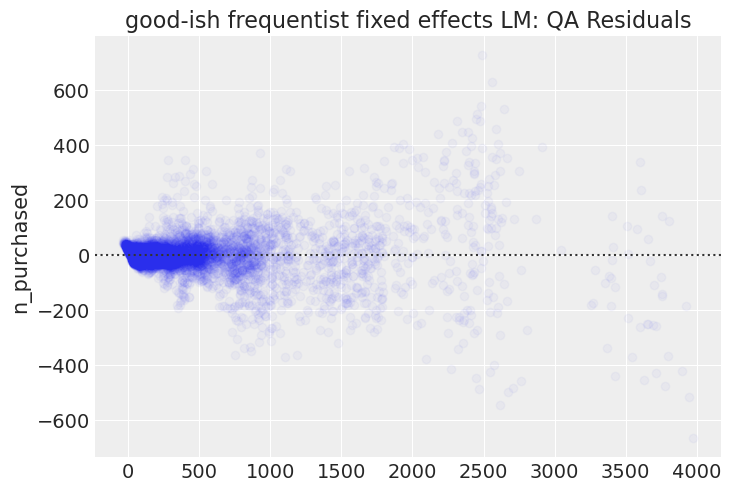

Text(0.5, 0.98, 'good-ish frequentist fixed effects LM: Normal Q-Q plot of resid., R^2 == 0.74')

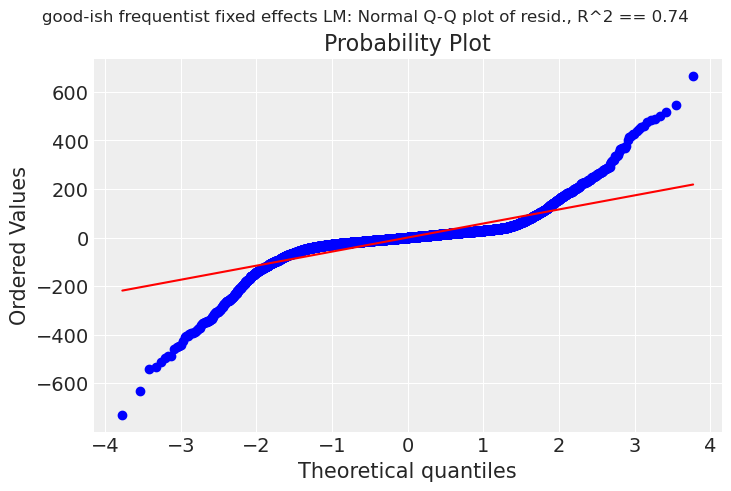

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'good-ish frequentist fixed effects LM: Residual distribution')

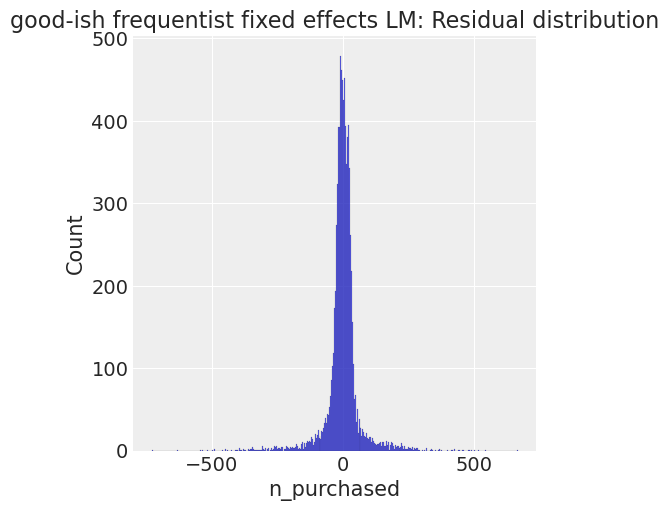

In [217]:
sns.residplot(
    fitted.fittedvalues,
    spends.n_purchased,
    scatter_kws={"alpha": 0.03},
)
plt.title("good-ish frequentist fixed effects LM: QA Residuals")
plt.show()

fig, ax = plt.subplots()
resids = fitted.fittedvalues - spends.n_purchased
_, (__, ___, r) = sp.stats.probplot(resids, plot=ax, dist="norm", fit=True)
plt.suptitle(
    f"good-ish frequentist fixed effects LM: Normal Q-Q plot of resid., R^2 == {r**2:.2f}"
)
plt.show()

sns.displot(resids)
plt.title("good-ish frequentist fixed effects LM: Residual distribution")
plt.show()

residuals reasonable within about +-2 SD but get weird at extremes

In [218]:
# frequentist fully unpooled effects (allow spend*market)

fomula = f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS)} + market*{' + market*'.join(spend_cols)}"
model = smf.ols(
    fomula,
    data=spends,
)
fitted = model.fit_regularized(alpha=1e-2, refit=True)
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     1787.
Date:                Sat, 11 Dec 2021   Prob (F-statistic):               0.00
Time:                        21:24:14   Log-Likelihood:                -45695.
No. Observations:                8567   AIC:                         9.241e+04
Df Residuals:                    8058   BIC:                         9.601e+04
Df Model:                         509                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                            110.5126     12.388      8.921      0.000      86.229     134.796
market[T.geo_1]                     -112.3815     16.480     -6.819      0.000    -144.687     -80.076
market[T.geo_10]                     -81.4377     15.408     -5.286      0.000    -111.641     -51.235
market[T.geo_11]                      -0.8212     16.579     -0.050      0.960     -33.320      31.678
market[T.geo_12]                    -116.4283     37.228     -3.127      0.002    -189.404     -43.452
market[T.geo_13]                    -143.5022     54.243     -2.646      0.008    -249.833     -37.171
market[T.geo_14]                    -108.3724     15.693     -6.906      0.000    -139.135     -77.610
market[T.geo_15]                     -87.9772     42.506     -2.070      0.039    -171.301      -4.654
market[T.geo_16]                     -58.6447     16.951     -3.460      0.001     -91.874     -25.416
market[T.geo_17]                    -108.4133     15.996     -6.778      0.000    -139.769     -77.058
market[T.geo_18]                     -16.3389     43.647     -0.374      0.708    -101.899      69.221
market[T.geo_19]                            0          0        nan        nan           0           0
market[T.geo_2]                       51.0236     16.063      3.176      0.001      19.536      82.511
market[T.geo_20]                    -102.8775     15.830     -6.499      0.000    -133.909     -71.846
market[T.geo_21]                    -122.9336     53.722     -2.288      0.022    -228.243     -17.625
market[T.geo_22]                    -101.9575     20.983     -4.859      0.000    -143.089     -60.826
market[T.geo_23]                    -117.6962     17.226     -6.832      0.000    -151.464     -83.928
market[T.geo_24]                     -75.3097     27.154     -2.773      0.006    -128.539     -22.081
market[T.geo_25]                    -106.5864     15.988     -6.667      0.000    -137.926     -75.246
market[T.geo_26]                     -83.0698     15.942     -5.211      0.000    -114.321     -51.819
market[T.geo_27]                    -115.5226     19.122     -6.041      0.000    -153.006     -78.039
market[T.geo_28]                    -109.5678     15.909     -6.887      0.000    -140.754     -78.382
market[T.geo_29]                     -97.3586     15.921     -6.115      0.000    -128.568     -66.149
market[T.geo_3]                     -112.5108     15.573     -7.225      0.000    -143.037     -81.984
market[T.geo_30]                    -102.3426     26.875     -3.808      0.000    -155.025     -49.661
market[T.geo_31]                    -101.5370     15.686     -6.473      0.000    -132.286     -70.788
market[T.geo_32]                    -114.1996     16.944     -6.740      0.000    -147.414     -

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='n_purchased'>

Text(0.5, 1.0, 'good-ish frequentist fully unpooled LM: QA Residuals')

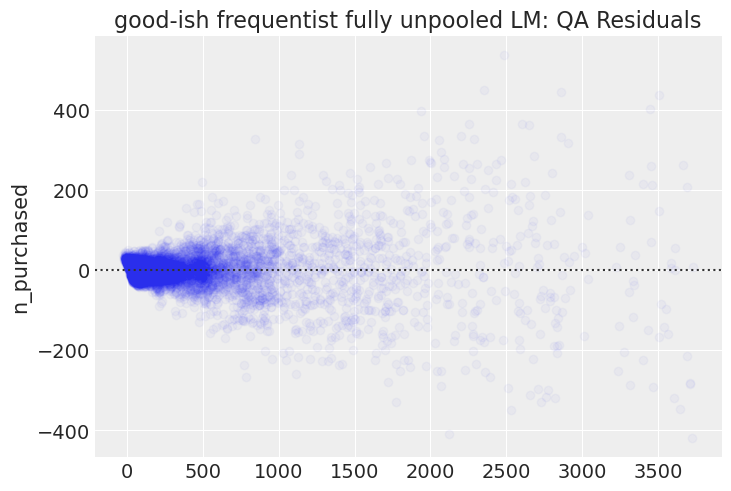

Text(0.5, 0.98, 'good-ish frequentist fully unpooled LM: Normal Q-Q plot of resid., R^2 == 0.77')

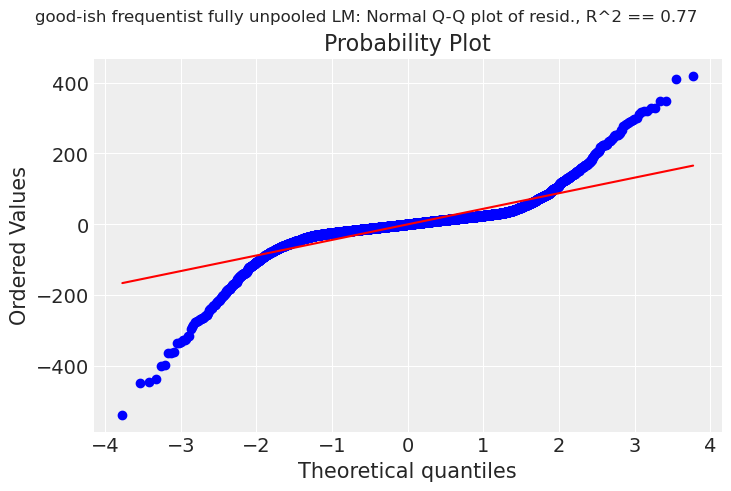

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'good-ish frequentist fully unpooled LM: Residual distribution')

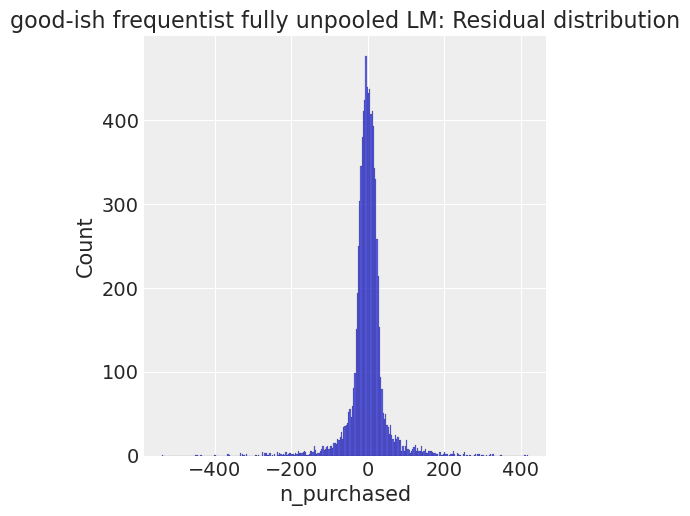

In [219]:
sns.residplot(
    fitted.fittedvalues,
    spends.n_purchased,
    scatter_kws={"alpha": 0.03},
)
plt.title("good-ish frequentist fully unpooled LM: QA Residuals")
plt.show()

fig, ax = plt.subplots()
resids = fitted.fittedvalues - spends.n_purchased
_, (__, ___, r) = sp.stats.probplot(resids, plot=ax, dist="norm", fit=True)
plt.suptitle(
    f"good-ish frequentist fully unpooled LM: Normal Q-Q plot of resid., R^2 == {r**2:.2f}"
)
plt.show()

sns.displot(resids)
plt.title("good-ish frequentist fully unpooled LM: Residual distribution")
plt.show()

In [287]:
GOOD_CONTROLS

['market', 'price', 'month_name', 'month_name_i', 'qtr_i']

'n_purchased ~ google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + market + price + C(month_name) + C(qtr_i)'

Formula: n_purchased ~ google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + market + price + C(month_name) + C(qtr_i)
Family name: Gaussian
Link: identity
Observations: 8567
Priors:
  Common-level effects
    Intercept ~ Flat()
    google_nonbrand ~ Flat()
    google_brand ~ Flat()
    facebook ~ Flat()
    instagram ~ Flat()
    direct_mail ~ Flat()
    youtube ~ Flat()
    sponsored_content ~ Flat()
    bing ~ Flat()
    pinterest ~ Flat()
    out_of_home ~ Flat()
    market ~ Flat()
    price ~ Flat()
    C(month_name) ~ Flat()
    C(qtr_i) ~ Flat()

  Auxiliary parameters
    sigma ~ HalfStudentT(nu: 4, sigma: 535.094)


Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_sigma, Intercept, C(qtr_i), C(month_name), price, market, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand]
INFO:pymc3:NUTS: [n_purchased_sigma, Intercept, C(qtr_i), C(month_name), price, market, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand]


Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 97 seconds.
INFO:pymc3:Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 97 seconds.
The number of effective samples is smaller than 10% for some parameters.


array([[<AxesSubplot:title={'center':'Intercept'}>,
        <AxesSubplot:title={'center':'Intercept'}>],
       [<AxesSubplot:title={'center':'google_nonbrand'}>,
        <AxesSubplot:title={'center':'google_nonbrand'}>],
       [<AxesSubplot:title={'center':'google_brand'}>,
        <AxesSubplot:title={'center':'google_brand'}>],
       [<AxesSubplot:title={'center':'facebook'}>,
        <AxesSubplot:title={'center':'facebook'}>],
       [<AxesSubplot:title={'center':'instagram'}>,
        <AxesSubplot:title={'center':'instagram'}>],
       [<AxesSubplot:title={'center':'direct_mail'}>,
        <AxesSubplot:title={'center':'direct_mail'}>],
       [<AxesSubplot:title={'center':'youtube'}>,
        <AxesSubplot:title={'center':'youtube'}>],
       [<AxesSubplot:title={'center':'sponsored_content'}>,
        <AxesSubplot:title={'center':'sponsored_content'}>],
       [<AxesSubplot:title={'center':'bing'}>,
        <AxesSubplot:title={'center':'bing'}>],
       [<AxesSubplot:title={'cent

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,325.613,44.474,243.467,408.168,1.631,1.154,744.0,1903.0,1.01
google_nonbrand,0.390,0.010,0.371,0.408,0.000,0.000,7930.0,8236.0,1.00
google_brand,-0.212,0.046,-0.298,-0.128,0.001,0.001,1949.0,4424.0,1.00
facebook,0.248,0.018,0.214,0.282,0.000,0.000,7274.0,7799.0,1.00
instagram,1.391,0.056,1.285,1.495,0.001,0.000,7440.0,7893.0,1.00
...,...,...,...,...,...,...,...,...,...
C(qtr_i)[17],62.591,22.935,17.954,103.643,0.964,0.682,567.0,1048.0,1.01
C(qtr_i)[18],59.729,23.528,15.726,103.872,0.985,0.697,572.0,1073.0,1.01
C(qtr_i)[19],66.834,23.564,21.232,108.784,0.983,0.695,576.0,1064.0,1.01
C(qtr_i)[20],78.705,23.579,35.013,123.058,0.979,0.693,581.0,1070.0,1.01


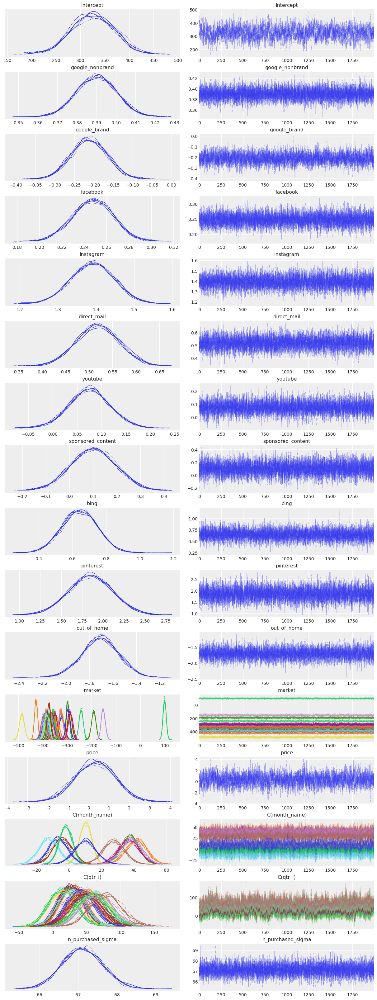

In [294]:
# also fit our frequentist fixed effects w/ PyMC/Bambi so that we can compare it to our Bayesian models later.
TUNE, DRAWS = 2_000, 2_000

# in order to mimic frequentist inference, we'll use a flat prior and ignore Bambi's good defaults.
# we won't be quite identical since frequentist inference relies on the MLE and we'll be using the posterior mean.
# (the latter tends to be slightly more robust/less likely to wildly fail to properly converge);
# but - good enough.
# Warn: model noise seems to have to be non-flat prior, which is fine.

uninformative_prior = bmb.Prior("Flat", auto_scale=False)
priors = {"common": uninformative_prior, "group_specific": uninformative_prior}
formula = f"{OUTCOME} ~ {' + '.join(spend_cols) + ' + market + price + C(month_name) + C(qtr_i)'}"
formula

model = bmb.Model(
    formula,
    data=spends,
    priors=priors,
)
model
freq_fe_results = model.fit(
    tune=TUNE,
    draws=DRAWS,
    cores=6,
)  # have 16 cores, might as well use some of them.

# Use ArviZ to plot the results
_ = az.plot_trace(freq_fe_results)

# Key summary and diagnostic info on the model parameters
az.summary(freq_fe_results)

as we'd imagine, ~same as frequentist results fitting with flat priors.

## Bayesian (Linear) Mixed Effects

This is the simple canned version that we can build with Bambi. 

In [298]:
spends.n_purchased.describe().round(1)

spends[spend_cols].mean().round(1)
spends[spend_cols].sum(axis="columns").mean()

spends[GOOD_CONTROLS].mean().round(1)

# on average, spend $2800/market/week and have 1200 purchased
# so we might imagine letting RoAS be within an order of magnitude or so of here.
# say $1 or $10 per marginal purchase seems reasonable, but $0.10 or $100 probably not!

# Likewise, we'll use an only mildly informative intercept that could fully explain our sales,
# say 2500 sales, 3 df t.

count    8567.0
mean      380.0
std       535.1
min         4.4
25%        74.8
50%       176.2
75%       455.3
max      3939.4
Name: n_purchased, dtype: float64

google_nonbrand      342.9
google_brand          53.3
facebook             183.6
instagram             63.4
direct_mail           69.2
youtube               74.7
sponsored_content     35.7
bing                  33.1
pinterest             13.1
out_of_home           18.2
dtype: float64

887.1743095599368

/tmp/ipykernel_1776/2695239441.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  spends[GOOD_CONTROLS].mean().round(1)


price    27.7
qtr_i    12.7
dtype: float64

### Drop-in replacement: use Bambi default priors

Formula: n_purchased ~ 0 + market + price + month_name + google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + (google_nonbrand|C(market)) + (google_brand|C(market)) + (facebook|C(market)) + (instagram|C(market)) + (direct_mail|C(market)) + (youtube|C(market)) + (sponsored_content|C(market)) + (bing|C(market)) + (pinterest|C(market)) + (out_of_home|C(market))
Family name: Gaussian
Link: identity
Observations: 8567
Priors:
  Common-level effects
    market ~ Normal(mu: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.], sigma: [ 7842.0888  9378.5075  7886.8409  8969.4727 11069.4424 15300.0148
  8156.4683 11990.2279  9430.5198  8494.8038 11829.1857 10406.0086
  8513.8447  8123.2444 15075.1088 10004.8991  9537.2739 10232.959
  8090.4393  8383.2747  9881.3962  8139.8034  8293.7347  8438.4659
 10232.959   8591.3

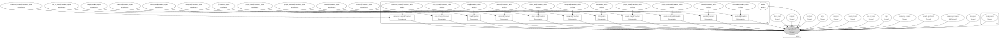

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_sigma, out_of_home|C(market)_offset, out_of_home|C(market)_sigma, pinterest|C(market)_offset, pinterest|C(market)_sigma, bing|C(market)_offset, bing|C(market)_sigma, sponsored_content|C(market)_offset, sponsored_content|C(market)_sigma, youtube|C(market)_offset, youtube|C(market)_sigma, direct_mail|C(market)_offset, direct_mail|C(market)_sigma, instagram|C(market)_offset, instagram|C(market)_sigma, facebook|C(market)_offset, facebook|C(market)_sigma, google_brand|C(market)_offset, google_brand|C(market)_sigma, google_nonbrand|C(market)_offset, google_nonbrand|C(market)_sigma, 1|C(market)_offset, 1|C(market)_sigma, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebo

KeyError: 0

In [223]:
# Sampling time explodes, so comment out.

# # naively fit without specifying priors. (note: will use brms-style mildly-informative priors.)
# # see bambi docs @ https://bambinos.github.io/bambi/main/notebooks/getting_started.html#Quickstart
# # and formulae formula syntax (extends e.g. Patsy) @ https://bambinos.github.io/formulae/

# interactions = [f"({c}|C(market))" for c in spend_cols]
# bayesian_auto_lr_model = bmb.Model(
#     f"{OUTCOME} ~ 0 + {' + '.join(GOOD_CONTROLS + spend_cols + interactions)}",
#     data=spends,
#     family="gaussian",  # failed w/ Neg. binomial
#     #link="identity",  # 'mis-specified'
# )
# bayesian_auto_lr_model
# bayesian_auto_lr_model.build()
# #_ = bayesian_auto_lr_model.plot_priors()
# plt.show()
# bayesian_auto_lr_model.graph()

# bayesian_auto_lr_results = bayesian_auto_lr_model.fit(
#     tune=TUNE,
#     draws=DRAWS,
#     target_accept=0.95,
#     max_treedepth=14,
#     cores=6,
# )  # have 16 cores, might as well use some of them.

# # Use ArviZ to plot the results
# az.plot_trace(bayesian_auto_lr_results)

# # Key summary and diagnostic info on the model parameters
# az.summary(bayesian_auto_lr_results)

# # Add posterior predictive to InferenceData + plot
# # posterior_predictive = bayesian_auto_lr_model.predict(bayesian_auto_lr_results, kind="pps", draws=500, inplace=True)
# # az.plot_ppc(bayesian_auto_lr_results)

In [224]:
# # # log-log?

# logged = spends.copy()
# num_cols = logged.select_dtypes(include=[np.number]).columns
# logged[num_cols] = np.log(1 + logged[num_cols])

# interactions = [f"({c}|C(market))" for c in spend_cols]
# priors = dict()
# priors["group_specific"] = bmb.Prior("HalfStudentT", sd=0.10, nu=5)
# priors["common"] = bmb.Prior("StudentT", sd=0.33, nu=5)

# priors["price"] = bmb.Prior("StudentT", sd=0.5, nu=5)
# #priors["nu"] = bmb.Prior("HalfStudentT", sd=20, nu=3)
# #priors["sigma"] = bmb.Prior("HalfStudentT", sd=spends.n_purchased.std() / 2, nu=5)

# bayesian_auto_loglog_model = bmb.Model(
#     f"{OUTCOME} ~ 0 + {' + '.join(GOOD_CONTROLS + spend_cols + interactions)}",
#     data=logged,
#     priors=priors,
#     family="negativebinomial",
# )
# bayesian_auto_loglog_model
# bayesian_auto_loglog_model.build()
# _ = bayesian_auto_loglog_model.plot_priors()
# plt.show()
# bayesian_auto_loglog_model.graph()

# bayesian_auto_loglog_results = bayesian_auto_loglog_model.fit(
#     tune=TUNE,
#     draws=DRAWS,
#     target_accept=0.95,
#     max_treedepth=14,
#     cores=6,
# )  # have 16 cores, might as well use some of them.

# # Use ArviZ to plot the results
# az.plot_trace(bayesian_auto_loglog_results)

# # Key summary and diagnostic info on the model parameters
# az.summary(bayesian_auto_loglog_results)

note the _positive_ coeff on price (obviously wrong) and the nonstationary trace.  

sampling ran into lots of problems, since priors carried very little information.  

still, the parameter estimates look a lot better than from our frequentist model, due to the ability to model market-level differences in slope.

{'google_nonbrand': HalfStudentT(sd: 0.5, nu: 5),
 'google_brand': HalfStudentT(sd: 0.5, nu: 5),
 'facebook': HalfStudentT(sd: 0.5, nu: 5),
 'instagram': HalfStudentT(sd: 0.5, nu: 5),
 'direct_mail': HalfStudentT(sd: 0.5, nu: 5),
 'youtube': HalfStudentT(sd: 0.5, nu: 5),
 'sponsored_content': HalfStudentT(sd: 0.5, nu: 5),
 'bing': HalfStudentT(sd: 0.5, nu: 5),
 'pinterest': HalfStudentT(sd: 0.5, nu: 5),
 'out_of_home': HalfStudentT(sd: 0.5, nu: 5),
 '(google_nonbrand|C(market))': StudentT(sd: 0.2, nu: 5),
 '(google_brand|C(market))': StudentT(sd: 0.2, nu: 5),
 '(facebook|C(market))': StudentT(sd: 0.2, nu: 5),
 '(instagram|C(market))': StudentT(sd: 0.2, nu: 5),
 '(direct_mail|C(market))': StudentT(sd: 0.2, nu: 5),
 '(youtube|C(market))': StudentT(sd: 0.2, nu: 5),
 '(sponsored_content|C(market))': StudentT(sd: 0.2, nu: 5),
 '(bing|C(market))': StudentT(sd: 0.2, nu: 5),
 '(pinterest|C(market))': StudentT(sd: 0.2, nu: 5),
 '(out_of_home|C(market))': StudentT(sd: 0.2, nu: 5),
 'market': Hal

Formula: n_purchased ~ 0 + market + price + C(month_name) + C(qtr_i) + google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + (google_nonbrand|C(market)) + (google_brand|C(market)) + (facebook|C(market)) + (instagram|C(market)) + (direct_mail|C(market)) + (youtube|C(market)) + (sponsored_content|C(market)) + (bing|C(market)) + (pinterest|C(market)) + (out_of_home|C(market))
Family name: Negativebinomial
Link: identity
Observations: 8567
Priors:
  Common-level effects
    market ~ HalfStudentT(sd: 535.1252, nu: 3)
    price ~ StudentT(sd: 0.5, nu: 3)
    C(month_name) ~ StudentT(sd: 267.5626, nu: 5)
    C(qtr_i) ~ StudentT(sd: 267.5626, nu: 5)
    google_nonbrand ~ HalfStudentT(sd: 0.5, nu: 5)
    google_brand ~ HalfStudentT(sd: 0.5, nu: 5)
    facebook ~ HalfStudentT(sd: 0.5, nu: 5)
    instagram ~ HalfStudentT(sd: 0.5, nu: 5)
    direct_mail ~ HalfStudentT(sd: 0.5, nu: 5)
    youtube ~ HalfStudentT(sd: 0.5, 

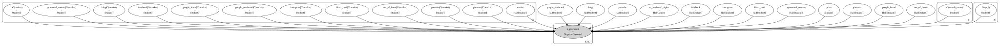

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_alpha, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand, C(qtr_i), C(month_name), price, market]
INFO:pymc3:NUTS: [n_purchased_alpha, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, bing, s

Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 1386 seconds.
INFO:pymc3:Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 1386 seconds.
The number of effective samples is smaller than 10% for some parameters.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
price,-0.130,0.085,-0.287,0.029,0.002,0.002,1393.0,2490.0,1.0
C(month_name)[August],-2.359,1.112,-4.441,-0.265,0.020,0.014,2974.0,5452.0,1.0
C(month_name)[December],7.139,1.277,4.741,9.567,0.023,0.016,3107.0,6169.0,1.0
C(month_name)[February],6.942,1.187,4.631,9.129,0.021,0.015,3148.0,5810.0,1.0
C(month_name)[January],7.052,1.272,4.665,9.430,0.023,0.016,3075.0,6154.0,1.0
...,...,...,...,...,...,...,...,...,...
sponsored_content,0.287,0.112,0.073,0.496,0.001,0.001,5381.0,3154.0,1.0
bing,0.880,0.123,0.645,1.107,0.001,0.001,12088.0,8382.0,1.0
pinterest,0.758,0.269,0.255,1.260,0.003,0.002,9666.0,4852.0,1.0
out_of_home,0.021,0.020,0.000,0.057,0.000,0.000,15876.0,6546.0,1.0


<AxesSubplot:xlabel='n_purchased / n_purchased'>

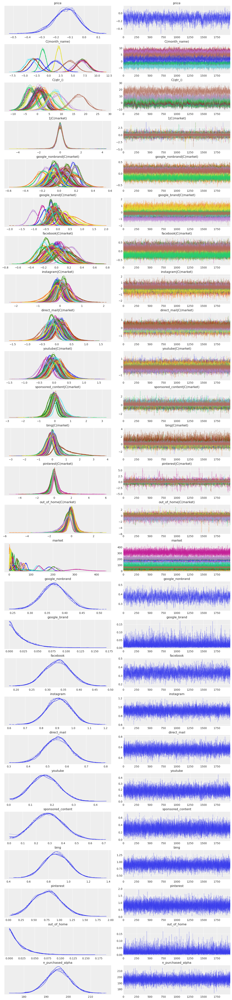

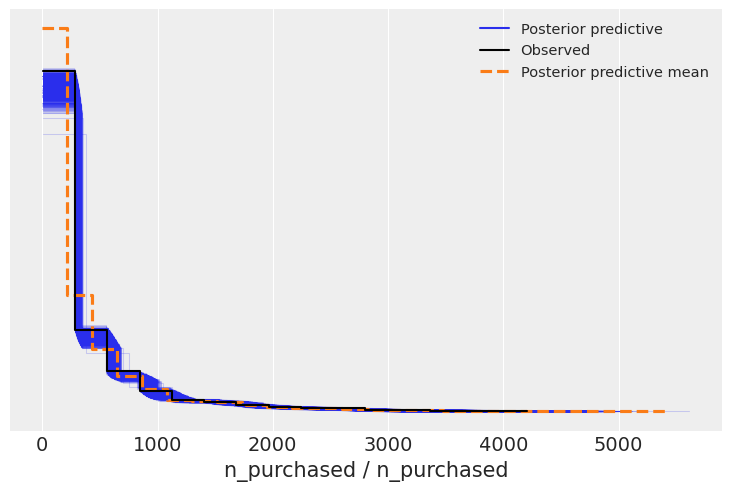

In [303]:
# Tweaked bayesian LR - negative binomial

market_intercept_prior = bmb.Prior("HalfStudentT", sd=spends.n_purchased.std(), nu=3)
spend_prior = bmb.Prior("HalfStudentT", sd=0.5, nu=5)
priors = {c: spend_prior for c in spend_cols}

interactions = [f"({c}|C(market))" for c in spend_cols]
interaction_prior = bmb.Prior("StudentT", sd=0.2, nu=5)
interaction_priors = {c: interaction_prior for c in interactions}
priors.update(interaction_priors)

priors["market"] = market_intercept_prior
# Unfortunately, I don't think we can easily do negative-constrained priors in Bambi, so use two-tailed.
# Of course, our price effect isn't simply additive, either.
priors["price"] = bmb.Prior("StudentT", sd=0.5, nu=3)
priors["group_specific"] = bmb.Prior("StudentT", sd=0.25, nu=5)
priors["common"] = bmb.Prior("StudentT", sd=0.5, nu=5)
priors["C(month_name)"] = bmb.Prior("StudentT", sd=spends.n_purchased.std() / 2, nu=5)
priors["C(qtr_i)"] = bmb.Prior("StudentT", sd=spends.n_purchased.std() / 2, nu=5)

priors

# note `0 +` - put all of intercept in market-intercept, zero in pooled intercept.
# otherwise we'll have very correlated params, which makes sampling hard.
# f"{OUTCOME} ~ 0 + {' + '.join(spend_cols + GOOD_CONTROLS)} + market|{' + market|'.join(spend_cols)}"
# spends.market = spends.market.astype("str")
# "n_purchased ~ 0 + C(market) + google_nonbrand + (0 + C(market):google_nonbrand)"
bayesian_lr_model = bmb.Model(
    f"{OUTCOME} ~ 0 + {' + '.join(['market + price + C(month_name) + C(qtr_i)'] + spend_cols + interactions)}",
    data=spends,
    priors=priors,
    family="negativebinomial",
    link="identity",  # 'mis-specified'
)
bayesian_lr_model
bayesian_lr_model.build()
# _ = bayesian_lr_model.plot_priors()
bayesian_lr_model.graph()

bayesian_lr_results = bayesian_lr_model.fit(
    tune=TUNE,
    draws=DRAWS,
    cores=6,
    target_accept=0.95,
    max_treedepth=14,
)  # have 16 cores, might as well use some of them.

# Use ArviZ to plot the results
_ = az.plot_trace(bayesian_lr_results)

# Key summary and diagnostic info on the model parameters
az.summary(bayesian_lr_results)

# Add posterior predictive to InferenceData + plot
posterior_predictive = bayesian_lr_model.predict(
    bayesian_lr_results, kind="pps", draws=200
)
az.plot_ppc(bayesian_lr_results)

not perfect, but much better.  

posterior predictive looks vaguely reasonable (but too many small values).  

note that by specifying reasonable, informative priors and a reasonable likelihood function (constrained to positive integers), we sample way faster.

__warn: required syntax for mixed effects is `feature|group` NOT `group|feature`.__ not sure if I'm dumb for not knowing this or if `bambi` should warn you when you create one group per observation.  

In [304]:
import gc

gc.collect()

852913

## Manually-specified PyMC3 Models  

We'll add a multiplicative price effect and hopefully random walks on coeffs.  

__TODO__:
- validate it didn't explode ;)  
- half-sat. parametrization from HelloFresh (see: https://www.pymc-labs.io/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/https://www.pymc-labs.io/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/)  
- better outcome parametrization? - log-log might be ok? gamma is janky but forces positive. neg-binomial typically has log(coeff). t or normal -> negative
- random walk coeffs  
- seasonality  

In [21]:
import copy
import warnings
import arviz as az


def assess_mc3(
    inferencedata: az.data.inference_data.InferenceData,
    model: pm.model.Model,
    trace_vars: [str] = None,
    forest_vars: [str] = None,
    ppc_vars: [str] = None,
    plot_forest: bool = True,
    model_name: str = "",
    raise_rhat: bool = True,
):
    if not isinstance(inferencedata, az.data.inference_data.InferenceData):
        raise (
            ValueError(
                "Param `inferencedata` requires Arviz inferencedata, not legacy PyMC3 trace."
            )
        )
    if not isinstance(model, pm.model.Model):
        raise (ValueError("Param `model` requires PyMC3 pm.model.Model."))

    inferencedata = copy.deepcopy(inferencedata)

    with model:
        ppc = az.from_dict(
            posterior_predictive=pm.fast_sample_posterior_predictive(
                inferencedata,
                # samples=1_000, # PyMC3 will complain if not all
                random_seed=42,
                keep_size=True,
            )
        )
        inferencedata.extend(ppc)  # inplace operation

    summary = az.summary(inferencedata)

    try:
        # 1.1 is a very loose standard for r_hat; even 1.01 is not great.
        assert (summary.r_hat < 1.1).all()

    except AssertionError as err:
        print(summary)
        print("Raising, r-hat > 1.1 for one or more parameters.")
        if raise_rhat:
            raise (err)

    all_rhat_lt_1_01 = (summary.r_hat < 1.01).all()
    if not all_rhat_lt_1_01:
        warnings.warn(
            "Warning: Some r-hat greater than 1.01, may have poor convergence."
        )

    az.plot_trace(
        inferencedata,
        var_names=trace_vars,
        show=False,
    )
    plt.suptitle(f"{model_name} traces (posterior probability density dist.)")
    plt.show()

    if plot_forest:  # can get messy for complex models
        az.plot_forest(
            inferencedata,
            var_names=forest_vars,  # plot all if None
            show=False,
        )
        plt.suptitle(f"{model_name} 94% Posterior Density (Bayesian 'CI')")
        plt.show()

    if ppc_vars:
        az.plot_ppc(
            inferencedata,
            alpha=0.10,
            kind="kde",
            var_names=ppc_vars,
            num_pp_samples=300,
            random_seed=42,
            figsize=(8, 6),
            show=False,
        )
        plt.title(f"{model_name}: posterior predictive fit")
        plt.show()
    else:
        "No PPC vars provided, skipping."

    return summary

In [22]:
def plot_priors(model: pm.model.Model, n: int = 5_000, seed=42):

    with model:
        prior_checks = pm.sample_prior_predictive(samples=n, random_seed=seed)

    COLS = 3
    rows = (len(prior_checks.items()) // COLS) + 1
    fig, axs = plt.subplots(
        rows,
        COLS,
        figsize=(10, rows * 3),
        sharex=False,
    )

    for i, (param, values) in enumerate(prior_checks.items()):
        values = pd.Series(values.ravel()).sample(n)
        # ignore extreme 1% of tails for ease of visualization
        lo, hi = values.quantile(0.005), values.quantile(0.995)
        values = values.loc[values.between(lo, hi)]
        ax = axs[i // COLS, i % COLS]
        _ = sns.histplot(
            values,
            kde=True,
            ax=ax,
        )
        _ = ax.set_title(f"{param}")

    _ = plt.suptitle("Prior Predictive Checks")
    plt.show()

### Custom Model, Constant Params  

- tried adding multiplicative price elasticity, ran into issues with divergences from posterior correlations b/w betas and elasticity  
- added multiplicative month-level seasonality  
- adding quarter-level timeseries

In [261]:
# debug
# temp = spends.loc[spends.market_idx < 5].copy()
spends_ = spends.copy()

n_mkts, n_channels = spends_.market.nunique(), len(spend_cols)
confound_cols = [c for c in GOOD_CONTROLS if "market" not in c]
n_confounds = len(confound_cols)

with pm.Model() as custom_pymc3_model:

    # I'm intentionally NOT pooling geo-level intercepts.
    # Since some markets might be 10x the size of another, there's
    #   not really anything to gain from pooling.
    # HOWEVER, one idea would be to model intercept as pop_size_in_mkt * param,
    #   in other words assuming organic demand scales with a city's population.
    # And in that alternate formulation, a global intercept with offsets could make sense!
    intercept = pm.HalfStudentT(
        "geo_demand_wo_ads",
        sd=spends_.n_purchased.std(),
        nu=3,
        shape=n_mkts,
        testval=100.0,
    )

    # Betas (RoAS)
    pool_b = pm.HalfStudentT(
        f"pooled_beta", sigma=0.5, nu=5, shape=(n_channels, 1), testval=0.2
    )
    grp_offset = pm.StudentT(
        f"geo_beta_offset",
        mu=0,
        sd=0.15,
        nu=5,
        shape=(n_channels, n_mkts),
        testval=0,
    )
    # Shared scale/unpooling param b/w geos for each channel.
    # (intuition: some channels will fluctuate more than others b/w geos)
    slope_unpool_scale = pm.HalfNormal(
        f"slope_unpool_scale", sd=1.0, shape=(n_channels, 1), testval=0.5
    )

    # After partial pooling, we hope to recover mRoAS
    beta = pm.Deterministic(
        "marginal_return_of_1_USD",
        pool_b + grp_offset * slope_unpool_scale,
    )

    # Month-level seasonality, fully-pooled
    seas = pm.StudentT(
        f"multiplicative_seasonality",
        mu=1,
        sd=0.10,
        nu=5,
        shape=spends.month_name_i.nunique(),
        testval=1,
    )
    # Quarter-level timeseries effects, fully-pooled
    trend = pm.StudentT(
        f"ts_trend",
        mu=1,
        sd=0.10,
        nu=5,
        shape=spends.qtr_i.nunique(),
        testval=1,
    )

    # Price elasticity is dy/dx (% change y / % change x).
    #   (again, I'm not an economist ;)
    # price_elasticity = pm.HalfNormal(
    #     "price_elasticity",
    #     sd=0.25,  # get divergences with fat tails or large SD
    #     testval=0.10,
    # )

    # shape/dispersion for Neg. Binomial
    alpha = pm.HalfStudentT("nbin_dispersion", sd=100, nu=5, testval=10)

    # Create theano shared tensors to allow for out-of-sample predictions.
    ad_spends = pm.Data("spends", spends_[spend_cols])
    # confounds = pm.Data("confounds", spends_[confound_cols])
    prices_rel_max = pm.Data("prices_rel_max", spends_.price.max() / spends_["price"])
    mkts = pm.Data("markets", spends_["market_idx"])
    obs = pm.Data(f"{OUTCOME}_obs", spends_[OUTCOME])
    month_idxs = pm.Data(f"months", spends_["month_name_i"])
    ts_idxs = pm.Data(f"qtrs", spends_["qtr_i"])

    mu = (
        intercept[mkts]
        + (ad_spends * beta[:, mkts].T).sum(axis=1) * seas[month_idxs] * trend[ts_idxs]
        # * (1 + price_elasticity)
        # * prices_rel_max
    )

    # We'll use neg. binomial (overdispersed count data).
    # Exponential fomulation that's traditional (addition in exp --> multiplicative effect of our betas)
    #   doesn't really make sense to me here,
    #   so I'll use it with an identity link, which is not unheard of.
    y_obs = pm.NegativeBinomial(
        OUTCOME,
        mu=mu,
        alpha=alpha,
        observed=obs,
    )

# check priors before sampling
# plot_priors(custom_pymc3_model)

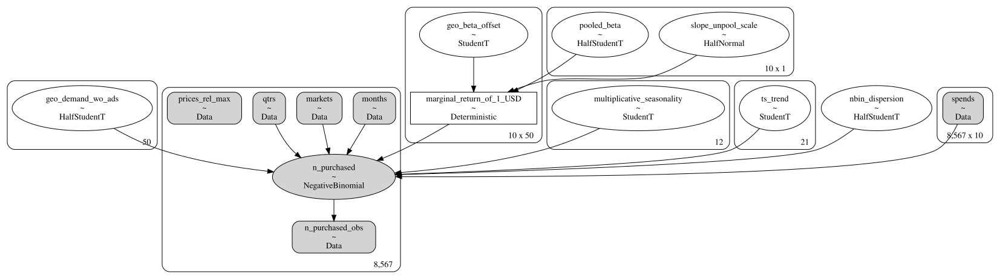

In [262]:
# custom_pymc3_model.build()
# custom_pymc3_model.graph()
pm.model_graph.model_to_graphviz(model=custom_pymc3_model)

In [263]:
with custom_pymc3_model:
    bayesian_custom_model_results = pm.sample(
        draws=2_000,
        tune=2_000,
        cores=6,
        random_seed=SEED,
        target_accept=0.95,  # helps with mixed models' funnel geometry in posterior
        max_treedepth=14,
        return_inferencedata=True,
    )

# before had 93/24k divergent. slow to sample.
# issue was presumably posterior correlation b/c betas effectively higher when elasticity higher.
# would love to reparametrize to include elasiticity.

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [nbin_dispersion, ts_trend, multiplicative_seasonality, slope_unpool_scale, geo_beta_offset, pooled_beta, geo_demand_wo_ads]
INFO:pymc3:NUTS: [nbin_dispersion, ts_trend, multiplicative_seasonality, slope_unpool_scale, geo_beta_offset, pooled_beta, geo_demand_wo_ads]


Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 1380 seconds.
INFO:pymc3:Sampling 6 chains for 2_000 tune and 2_000 draw iterations (12_000 + 12_000 draws total) took 1380 seconds.
The number of effective samples is smaller than 10% for some parameters.


/tmp/ipykernel_1776/402984846.py:52: UserWarning: Warning: Some r-hat greater than 1.01, may have poor convergence.
  warnings.warn(


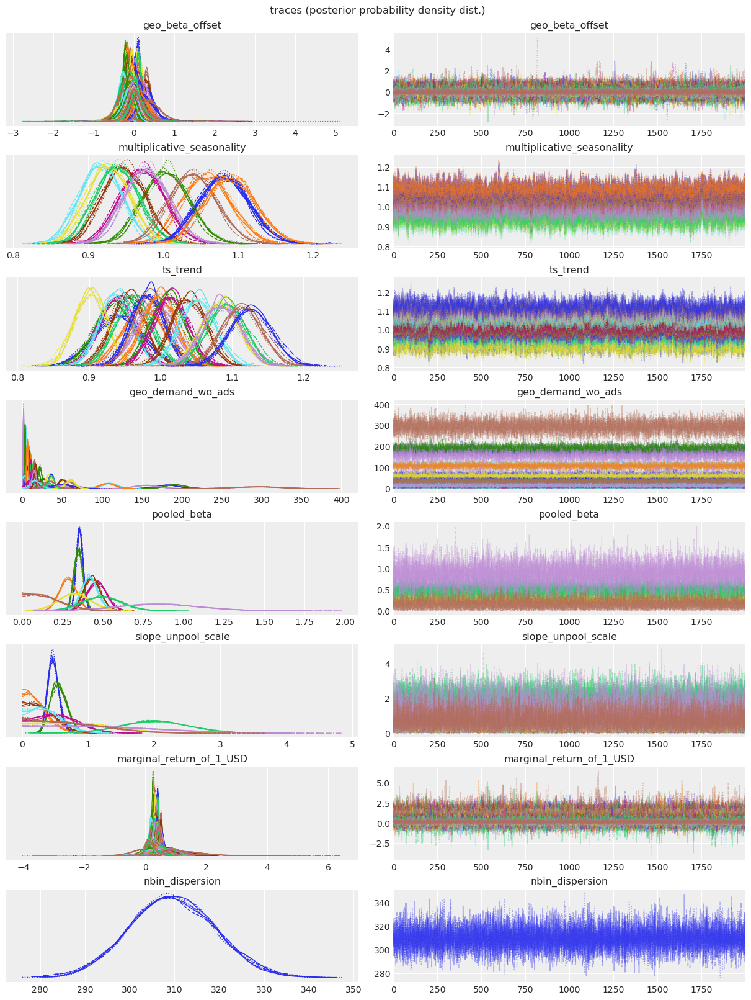

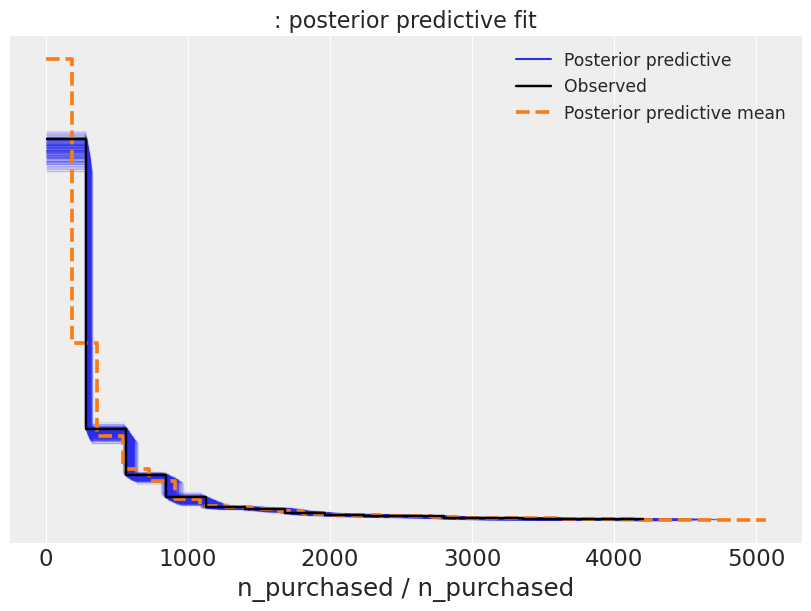

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"geo_beta_offset[0, 0]",0.110,0.067,-0.015,0.239,0.001,0.000,12896.0,9280.0,1.0
"geo_beta_offset[0, 1]",-0.101,0.097,-0.277,0.088,0.001,0.001,16766.0,8516.0,1.0
"geo_beta_offset[0, 2]",-0.217,0.069,-0.345,-0.089,0.001,0.001,8646.0,7914.0,1.0
"geo_beta_offset[0, 3]",0.204,0.119,-0.019,0.430,0.001,0.001,12757.0,7000.0,1.0
"geo_beta_offset[0, 4]",0.122,0.087,-0.042,0.284,0.001,0.001,14856.0,8319.0,1.0
...,...,...,...,...,...,...,...,...,...
"marginal_return_of_1_USD[9, 46]",0.133,0.178,-0.199,0.485,0.001,0.001,18192.0,9339.0,1.0
"marginal_return_of_1_USD[9, 47]",0.224,0.215,-0.115,0.661,0.002,0.002,13376.0,9111.0,1.0
"marginal_return_of_1_USD[9, 48]",0.142,0.188,-0.197,0.525,0.002,0.001,15564.0,7846.0,1.0
"marginal_return_of_1_USD[9, 49]",0.148,0.189,-0.195,0.519,0.001,0.001,17067.0,9452.0,1.0


In [264]:
assess_mc3(
    bayesian_custom_model_results,
    custom_pymc3_model,
    raise_rhat=False,
    plot_forest=False,
    ppc_vars=["n_purchased"],
)

In [277]:
summary = az.summary(
    bayesian_custom_model_results,
    var_names=["pooled_beta"],
    filter_vars="like",
)
summary["channel_name"] = spend_cols

summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,channel_name
"pooled_beta[0, 0]",0.357,0.021,0.318,0.396,0.000,0.000,2340.0,5340.0,1.0,google_nonbrand
"pooled_beta[1, 0]",0.284,0.052,0.188,0.384,0.001,0.000,10926.0,8083.0,1.0,google_brand
"pooled_beta[2, 0]",0.350,0.028,0.298,0.404,0.000,0.000,3532.0,6826.0,1.0,facebook
"pooled_beta[3, 0]",0.464,0.058,0.355,0.573,0.001,0.000,7979.0,8311.0,1.0,instagram
"pooled_beta[4, 0]",0.434,0.052,0.338,0.530,0.001,0.000,8187.0,8147.0,1.0,direct_mail
"pooled_beta[5, 0]",0.418,0.050,0.323,0.511,0.001,0.000,7072.0,8321.0,1.0,youtube
"pooled_beta[6, 0]",0.326,0.097,0.146,0.514,0.001,0.001,11900.0,5938.0,1.0,sponsored_content
"pooled_beta[7, 0]",0.493,0.119,0.264,0.707,0.001,0.001,10463.0,7903.0,1.0,bing
"pooled_beta[8, 0]",0.843,0.252,0.374,1.327,0.002,0.002,12437.0,5971.0,1.0,pinterest
"pooled_beta[9, 0]",0.150,0.106,0.000,0.338,0.001,0.001,12871.0,5885.0,1.0,out_of_home


__conclusions from our final model:__

we're correctly able to identify out of home channel as underperforming, but we overestimate one of our small channels' effectiveness (Pinterest) and underestimate one of our other efficient channels (Google brand).  

Most of our coefficients are biased up - should be around 0.2-0.3 but are instead around 0.3-0.5. that is, we overestimate our marketing efficiency - this is a well-known tendency with non-experimental marketing measurements.  

/tmp/ipykernel_13754/3039483701.py:51: UserWarning: Some r-hat greater than 1.01, may have poor convergence.
  warnings.warn("Some r-hat greater than 1.01, may have poor convergence.")


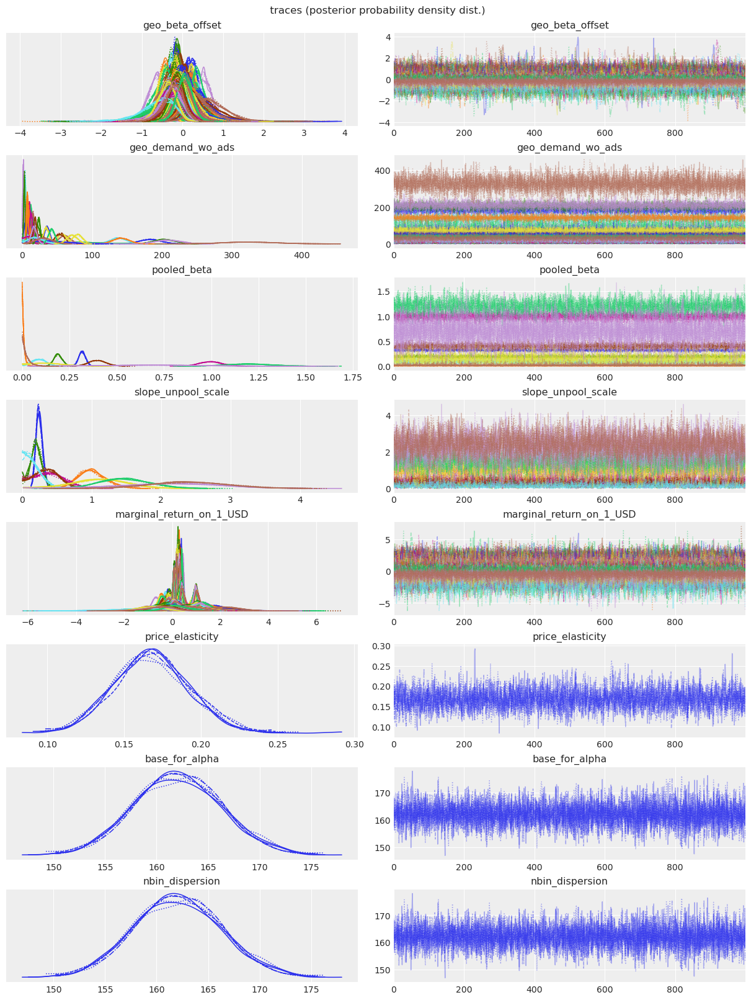

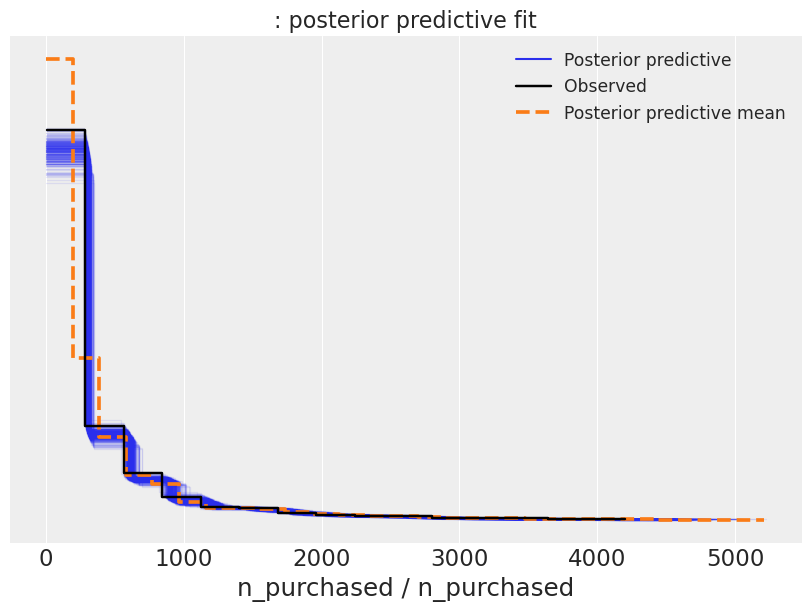

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"geo_beta_offset[0, 0]",0.284,0.146,0.008,0.550,0.002,0.002,5161.0,3449.0,1.0
"geo_beta_offset[0, 1]",-0.117,0.184,-0.486,0.216,0.002,0.002,6459.0,3716.0,1.0
"geo_beta_offset[0, 2]",-0.293,0.130,-0.539,-0.058,0.002,0.001,4779.0,4192.0,1.0
"geo_beta_offset[0, 3]",0.235,0.204,-0.134,0.625,0.002,0.002,7777.0,4448.0,1.0
"geo_beta_offset[0, 4]",0.141,0.167,-0.192,0.446,0.002,0.002,7849.0,4345.0,1.0
...,...,...,...,...,...,...,...,...,...
"marginal_return_on_1_USD[9, 48]",-0.674,0.625,-1.908,0.397,0.009,0.007,5137.0,4437.0,1.0
"marginal_return_on_1_USD[9, 49]",-0.518,0.619,-1.726,0.595,0.007,0.007,7601.0,4482.0,1.0
price_elasticity,0.168,0.025,0.123,0.215,0.000,0.000,3063.0,4256.0,1.0
base_for_alpha,162.089,4.270,154.107,170.153,0.042,0.029,10470.0,4687.0,1.0


In [140]:
# earlier output without seasonality+trend

assess_mc3(
    bayesian_custom_model_results,
    custom_pymc3_model,
    raise_rhat=False,
    plot_forest=False,
)

## Model Comparison  

We'd often include a true dummy model (i.e. predict mean for all x), but I've omitted to make our comparison more readable.  

In [318]:
df_comp_loo = az.compare(
    {
        "freq_FE": freq_fe_results,
        # "bayes_mixed_auto": bayesian_auto_lr_results,
        "bayes_mixed_manual": bayesian_lr_results,
        "bayes_custom": bayesian_custom_model_results,
    },
    ic="loo",
    method="stacking",
)
df_comp_loo

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
bayes_custom,0,-36619.401308,201.814167,0.000000,0.983242,119.516764,0.000000,False,log
bayes_mixed_manual,1,-37593.959290,262.342162,974.557982,0.013174,120.792279,42.873639,False,log
freq_FE,2,-48277.487945,168.556923,11658.086637,0.003584,205.096069,193.592863,True,log


<AxesSubplot:xlabel='Log'>

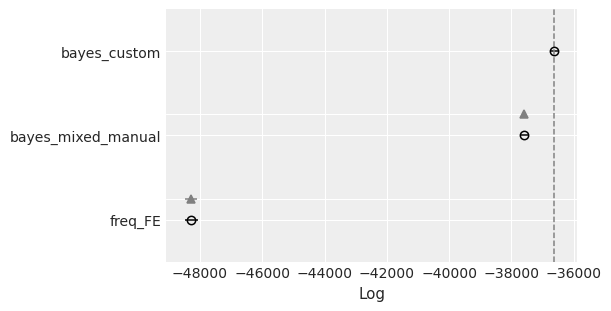

In [306]:
az.plot_compare(df_comp_loo, insample_dev=False)

## Appendices + Garbage

### Appendix 1: Could we have used (batch, full-rank) ADVI? (No.)  

in my experience  
- full-rank advi: typically get poor results, but it's fast  
- svgd: typically get decent results (little wiggly, not perfect, often good enough), but it's not _that_ much faster than MCMC  

I also don't want to duplicate a bunch of model code, so I'll omit minibatches for now. (Note that minibatching is mathematically impossible with current formulations of MCMC.)  

Finished [100%]: Average Loss = 44,730
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 44,730


Text(0.5, 1.0, 'ADVI convergence')

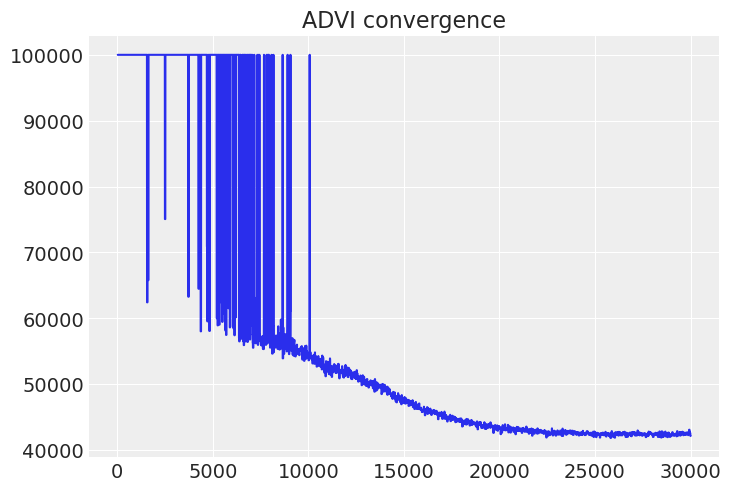

In [307]:
with custom_pymc3_model:
    mean_field = pm.fit(
        # note: better to use minibatches, but I don't want to duplicate code.
        n=30_000,
        method="fullrank_advi",
        random_seed=SEED,
    )
    plt.plot(pd.Series(mean_field.hist).clip(upper=100_000).rolling(25).min())
    plt.title("ADVI convergence")
    advi_custom_model_results = mean_field.sample(10_000)

arviz - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,channel_name
"pooled_beta[0, 0]",0.200,0.160,0.017,0.473,0.002,0.001,9807.0,9768.0,NaN,google_nonbrand
"pooled_beta[1, 0]",0.287,0.482,0.003,0.884,0.005,0.004,9455.0,9380.0,NaN,google_brand
"pooled_beta[2, 0]",0.225,0.230,0.014,0.587,0.002,0.002,10334.0,9086.0,NaN,facebook
"pooled_beta[3, 0]",0.306,0.470,0.004,0.923,0.005,0.003,10165.0,9559.0,NaN,instagram
"pooled_beta[4, 0]",0.297,0.446,0.005,0.879,0.005,0.003,10246.0,9452.0,NaN,direct_mail
"pooled_beta[5, 0]",0.302,0.438,0.004,0.914,0.004,0.003,9530.0,9600.0,NaN,youtube
"pooled_beta[6, 0]",0.405,0.737,0.002,1.303,0.007,0.005,10067.0,9803.0,NaN,sponsored_content
"pooled_beta[7, 0]",0.414,0.883,0.001,1.344,0.009,0.006,10129.0,9307.0,NaN,bing
"pooled_beta[8, 0]",0.519,1.162,0.002,1.772,0.012,0.008,9968.0,10139.0,NaN,pinterest
"pooled_beta[9, 0]",0.417,0.871,0.001,1.304,0.009,0.006,9759.0,9224.0,NaN,out_of_home


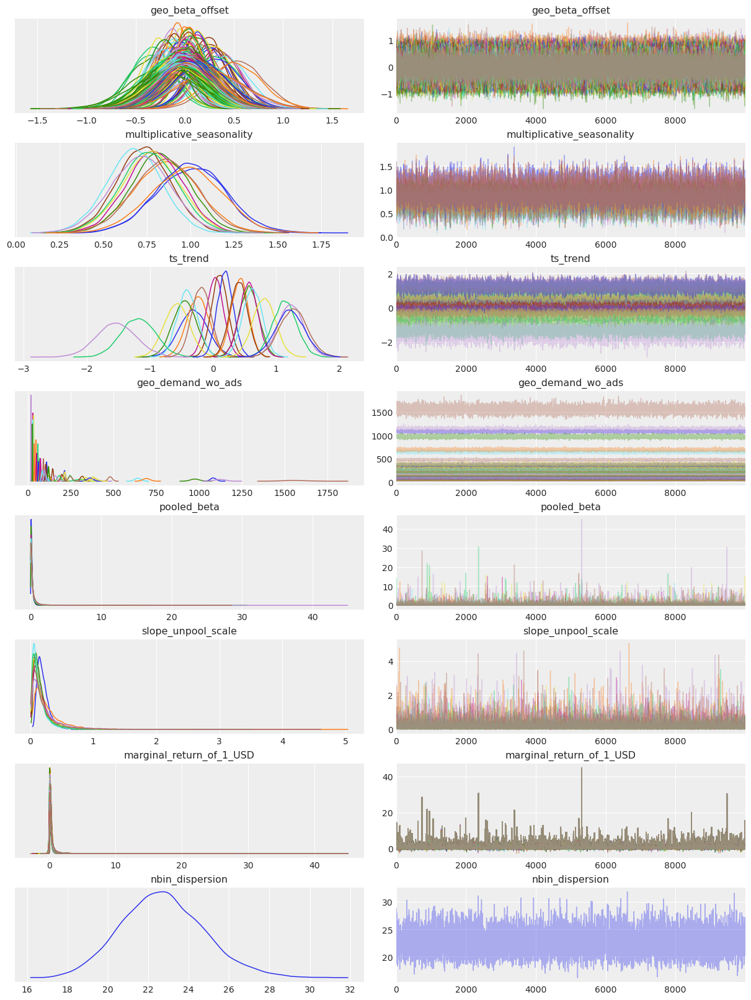

In [312]:
with custom_pymc3_model:
    # assess_mc3(
    #     az.from_pymc3(advi_custom_model_results),
    #     custom_pymc3_model,
    #     raise_rhat=False,
    #     plot_forest=False,
    # )

    _ = az.plot_trace(
        advi_custom_model_results,
        # var_names=trace_vars,
        show=False,
    )
    advi_summary = az.summary(
        advi_custom_model_results,
        var_names=["pooled_beta"],
        filter_vars="like",
    )
    advi_summary["channel_name"] = spend_cols
    advi_summary

In [316]:
print("% difference in mean b/w MCMC & ADVI: MCMC coeff generally larger")
(summary["mean"] - advi_summary["mean"]) / summary["mean"]

print("% difference in SE b/w MCMC & ADVI: ADVI much higher SE")
(summary["sd"] - advi_summary["sd"]) / summary["sd"]

% difference in mean b/w MCMC & ADVI: MCMC coeff generally larger


pooled_beta[0, 0]    0.439776
pooled_beta[1, 0]   -0.010563
pooled_beta[2, 0]    0.357143
pooled_beta[3, 0]    0.340517
pooled_beta[4, 0]    0.315668
pooled_beta[5, 0]    0.277512
pooled_beta[6, 0]   -0.242331
pooled_beta[7, 0]    0.160243
pooled_beta[8, 0]    0.384342
pooled_beta[9, 0]   -1.780000
Name: mean, dtype: float64

% difference in SE b/w MCMC & ADVI: ADVI much higher SE


pooled_beta[0, 0]   -6.619048
pooled_beta[1, 0]   -8.269231
pooled_beta[2, 0]   -7.214286
pooled_beta[3, 0]   -7.103448
pooled_beta[4, 0]   -7.576923
pooled_beta[5, 0]   -7.760000
pooled_beta[6, 0]   -6.597938
pooled_beta[7, 0]   -6.420168
pooled_beta[8, 0]   -3.611111
pooled_beta[9, 0]   -7.216981
Name: sd, dtype: float64

unsurprisingly, our results are wildly different and incorrect (e.g. same pooled beta for each marketing channel). this obviously won't work.  

one of my big complaints with VI is - if we can't have faith without validating with MCMC, then we have to run MCMC... and then we'll just use the MCMC result that we can trust!  
I will continue to await better VI approaches.  

we could also try SVGD, which would probably work decently.  

In [55]:
# #### svgd (+ minibatch)

# with custom_pymc3_model:
#     svgd_approx = pm.fit(
#         500,
#         method="svgd",
#         inf_kwargs=dict(n_particles=1000),
#         obj_optimizer=pm.sgd(learning_rate=0.01),
#     )
#     #plt.plot(pd.Series(mean_field.hist).clip(upper=100_000).rolling(25).min())
#     #plt.title("ADVI convergence")
#     svgd_custom_model_results = svgd_approx.sample(10_000)

### Appendix 2: Debugging Shape Woes

In [141]:
# check shapes
spends_[spend_cols].shape

beta.tag.test_value.shape

# for loop implementation
beta[i, mkts].tag.test_value.shape  # (n_obs, )

# attempt at vectorized implementation
beta[
    :, mkts
].tag.test_value.shape  # should produce (n_channel, n_geo) but instead (n_channel, n_obs)!
beta[:, :].tag.test_value.shape
# mu.tag.test_value.shape
# note: mu is 1040x1040, obviously wrong

# figure out `shape` on sim data

rng2 = np.random.default_rng(2001)

spend_ish = rng2.normal(5, 1, size=(1040, 10))
beta_ish = rng2.normal(0.3, 0.1, size=(10, 5))
mkts_ish = rng2.integers(0, 4, size=1040)

np.dot(spend_ish, beta_ish).shape
np.dot(spend_ish, beta_ish[:, mkts_ish]).shape
(spend_ish * np.take(beta_ish, mkts_ish, axis=1).T).shape
(spend_ish * beta_ish[:, mkts_ish].T).shape
(spend_ish * beta_ish[:, mkts_ish].T).sum(axis=1).shape


# beta[:, mkts])

(1040, 5)

(1040, 1040)

(1040, 10)

(1040, 10)

(1040,)

### Appendix 3: Debugging Convergence Issues

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 0.98, 'Diagnose: divergences largely at higher elasticity')

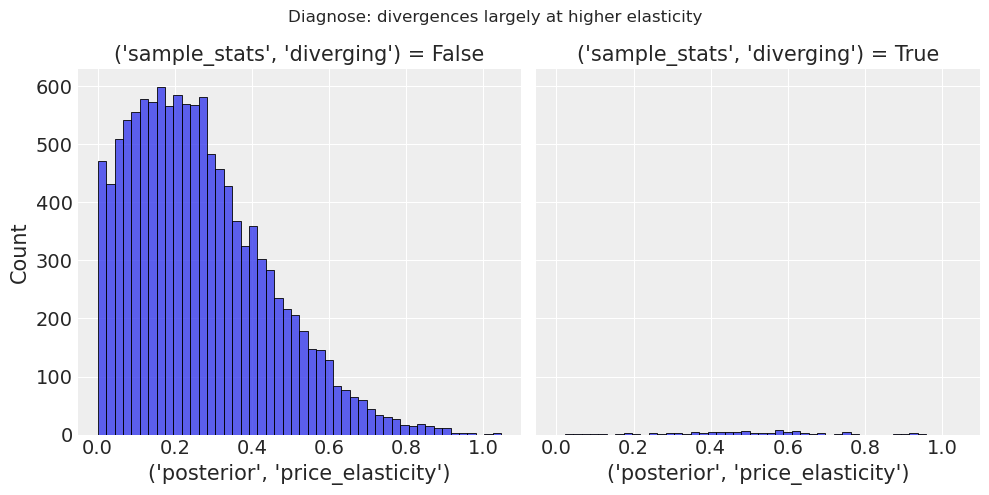

In [197]:
as_df = bayesian_custom_model_results.to_dataframe()

sns.displot(
    data=as_df,
    x=("posterior", "price_elasticity"),
    col=("sample_stats", "diverging"),
    kind="hist",
)
plt.suptitle("Diagnose: divergences largely at higher elasticity")
plt.tight_layout()

In [278]:
# az.plot_pair(
#     bayesian_custom_model_results,
#     var_names=["marginal_return_of_1_USD"],
#     kind="kde",
#     # divergences=True,
#     figsize=(12, 12),
# )

# debugging posterior correlations